#Librerías

#Consideraciones
##Oro Blanco le falta info o días

In [465]:
!pip install ta

In [466]:
import pandas as pd
import ta
import numpy as np
!pip install mplfinance
import matplotlib.pyplot as plt


In [467]:
import mplfinance as mpf

#Aguas Andina

##Cargar la información

In [468]:
df_aguas_a = pd.read_csv('AGUAS_A.csv', index_col = 'Date')
df_aguas_a.head()

,Open,High,Low,Close,Volume
Date,,,,,
2014-04-21,342.35,343.50,342.00,343.20,1332972
2014-04-22,342.00,343.00,340.00,340.86,1284030
2014-04-23,340.86,343.01,341.51,342.00,1048269
2014-04-24,342.00,342.00,340.50,340.70,1282877
2014-04-25,340.70,341.00,339.50,339.65,704015


In [469]:
print(df_aguas_a)

              Open    High     Low   Close   Volume
Date                                               
2014-04-21  342.35  343.50  342.00  343.20  1332972
2014-04-22  342.00  343.00  340.00  340.86  1284030
2014-04-23  340.86  343.01  341.51  342.00  1048269
2014-04-24  342.00  342.00  340.50  340.70  1282877
2014-04-25  340.70  341.00  339.50  339.65   704015
...            ...     ...     ...     ...      ...
2024-04-15  280.00  280.78  275.01  278.00  3463336
2024-04-16  278.00  278.73  272.00  276.99  6160229
2024-04-17  276.99  276.00  273.00  273.54  2018624
2024-04-18  273.50  275.00  270.50  273.53  2194508
2024-04-19  273.53  273.87  265.02  265.02  4176063

[2491 rows x 5 columns]


##Cálculo de la media móvil simple para una ventana de 10 periodos para Aguas Andina

In [470]:
df_aguas_a['aguas_a_sma_10'] = ta.trend.sma_indicator(df_aguas_a['Close'], window = 10)
df_aguas_a[['Close','aguas_a_sma_10']].head(10)

,Close,aguas_a_sma_10
Date,,
2014-04-21,343.20,NaN
2014-04-22,340.86,NaN
2014-04-23,342.00,NaN
2014-04-24,340.70,NaN
2014-04-25,339.65,NaN
2014-04-28,344.97,NaN
2014-04-29,345.18,NaN
2014-04-30,349.31,NaN
2014-05-02,354.45,NaN


##Cálculo del indicador estocástico con una ventana de 14 periodos para Aguas Andina

In [471]:
df_aguas_a['aguas_a_stoch_k'] = ta.momentum.stoch(
    df_aguas_a['High'], df_aguas_a['Low'], df_aguas_a['Close'],
    window = 14, smooth_window = 1)

##Columna booleana indica cuándo se supero la media para aguas andina

In [472]:
#df_aguas_a         #Son 2491 filas en total
df_aguas_a['msa_aguas_a'] = np.nan
i = 9
while i <= 2490:
  if df_aguas_a['Close'].iloc[i] > df_aguas_a['aguas_a_sma_10'].iloc[i]:              #Al final se quitan los warnings
    df_aguas_a['msa_aguas_a'].iloc[i] = 1
  else:
    df_aguas_a['msa_aguas_a'].iloc[i] = 0
  i += 1



Se han truncado las últimas 5000 líneas del flujo de salida.
<ipython-input-472-c7670531b65c>:6: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_aguas_a['msa_aguas_a'].iloc[i] = 1
<ipython-input-472-c7670531b65c>:8: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_aguas_a['msa_aguas_a'].iloc[i] = 0
<ipython-input-472-c7670531b65c>:8: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_aguas_a['msa_aguas_a'].iloc[i] = 0
<ipython-input-472

In [473]:
df_aguas_a.tail(20)

,Open,High,Low,Close,Volume,aguas_a_sma_10,aguas_a_stoch_k,msa_aguas_a
Date,,,,,,,,
2024-03-22,283.10,286.00,277.51,279.65,1808020,280.486,56.731335,0.0
2024-03-25,277.11,278.05,274.23,275.85,8196892,280.221,34.391534,0.0
2024-03-26,275.85,279.49,276.00,278.99,2919214,280.470,52.851264,0.0
2024-03-27,278.99,284.00,279.01,284.00,1964409,281.145,82.304527,1.0
2024-03-28,284.00,286.00,279.53,286.00,2389571,281.945,93.691443,1.0
2024-04-01,285.00,285.00,281.49,283.50,1923727,282.155,78.076202,1.0
2024-04-02,283.50,286.60,281.00,283.50,2231826,282.505,78.076202,1.0
2024-04-03,283.50,284.00,282.53,283.98,1043630,282.456,81.074329,1.0
2024-04-04,283.98,283.90,276.56,279.30,3097743,281.787,44.130435,0.0


#Andina B

In [474]:
df_andina = pd.read_csv('ANDINA_B.csv', index_col = 'Date')
df_andina.head()

,Open,High,Low,Close,Volume
Date,,,,,
2014-04-21,2338.0,2338.0,2230.0,2284.7,148845
2014-04-22,2284.7,2270.0,2237.8,2250.0,940452
2014-04-23,2250.0,2255.0,2221.0,2229.1,713034
2014-04-24,2229.1,2263.0,2186.0,2214.7,568845
2014-04-25,2214.7,2192.6,2155.0,2173.9,76409


#Cálculo de la media móvil simple para una ventana de 10 periodos para  Andina B

In [475]:
df_andina['andina_b_sma_10'] = ta.trend.sma_indicator(df_andina['Close'], window = 10)
df_andina[['Close','andina_b_sma_10']].head(10)

,Close,andina_b_sma_10
Date,,
2014-04-21,2284.7,NaN
2014-04-22,2250.0,NaN
2014-04-23,2229.1,NaN
2014-04-24,2214.7,NaN
2014-04-25,2173.9,NaN
2014-04-28,2166.4,NaN
2014-04-29,2217.6,NaN
2014-04-30,2272.8,NaN
2014-05-02,2284.8,NaN


##Cálculo del indicador estocástico con una ventana de 14 periodos para Andina B

In [476]:
df_andina['andina_b_stoch_k'] = ta.momentum.stoch(
    df_andina['High'], df_andina['Low'], df_andina['Close'],
    window = 14, smooth_window = 1)

##Columna booleana indica cuándo se supero la media para Andina B

In [477]:
# df_andina         #Son 2491 filas en total
df_andina['msa_andina_b'] = np.nan        #Inicializa la columna con valores nulos
i = 9
while i <= 2490:
  if df_andina['Close'].iloc[i] > df_andina['andina_b_sma_10'].iloc[i]:              #Al final se quitan los warnings
    df_andina['msa_andina_b'].iloc[i] = 1
  else:
    df_andina['msa_andina_b'].iloc[i] = 0
  i += 1


Se han truncado las últimas 5000 líneas del flujo de salida.
<ipython-input-477-c9a2257d8c26>:8: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_andina['msa_andina_b'].iloc[i] = 0
<ipython-input-477-c9a2257d8c26>:8: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_andina['msa_andina_b'].iloc[i] = 0
<ipython-input-477-c9a2257d8c26>:8: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_andina['msa_andina_b'].iloc[i] = 0
<ipython-input-477

In [478]:
df_andina.tail(20)

,Open,High,Low,Close,Volume,andina_b_sma_10,andina_b_stoch_k,msa_andina_b
Date,,,,,,,,
2024-03-22,2548.0,2548.1,2508.2,2510.0,419957,2567.29,35.077067,0.0
2024-03-25,2510.0,2542.2,2451.0,2500.0,1403222,2560.29,25.125628,0.0
2024-03-26,2500.0,2520.1,2455.0,2477.0,376913,2549.38,13.567839,0.0
2024-03-27,2461.0,2502.0,2461.0,2485.0,561039,2538.39,17.171717,0.0
2024-03-28,2485.0,2524.8,2480.0,2482.1,512729,2527.60,15.707071,0.0
2024-04-01,2482.1,2529.0,2485.2,2495.9,495433,2529.41,22.676768,0.0
2024-04-02,2495.9,2518.0,2480.0,2510.0,780243,2521.71,29.797980,0.0
2024-04-03,2510.0,2540.0,2487.0,2495.0,801156,2506.31,22.222222,0.0
2024-04-04,2508.0,2544.4,2487.2,2505.2,393884,2500.82,27.373737,1.0


#Datos BCI

In [479]:
df_bci = pd.read_csv('BCI.csv', index_col = 'Date')
print(df_bci)

                 Open       High        Low      Close  Volume
Date                                                          
2014-04-21  21619.012  21625.574  21231.785  21355.828   15639
2014-04-22  21355.828  21592.758  20870.812  21011.920   13876
2014-04-23  21011.920  20936.443  20411.390  20473.086   43420
2014-04-24  20473.086  20629.287  20346.416  20457.334   49212
2014-04-25  20457.334  20581.377  20378.576  20480.960   52162
...               ...        ...        ...        ...     ...
2024-04-15  27851.000  28200.000  27301.000  27420.000  100674
2024-04-16  27400.000  27553.000  26601.000  26812.000  108449
2024-04-17  26812.000  27360.000  26400.000  26609.000  152702
2024-04-18  26609.000  27500.000  26600.000  27359.000  151961
2024-04-19  27300.000  27445.000  26800.000  26800.000   34516

[2491 rows x 5 columns]


##Cálculo de la media móvil simple para una ventana de 10 periodos para BCI

In [480]:
df_bci['bci_sma_10'] = ta.trend.sma_indicator(df_bci['Close'], window = 10)
df_bci[['Close','bci_sma_10']].head(10)

,Close,bci_sma_10
Date,,
2014-04-21,21355.828,NaN
2014-04-22,21011.920,NaN
2014-04-23,20473.086,NaN
2014-04-24,20457.334,NaN
2014-04-25,20480.960,NaN
2014-04-28,20227.623,NaN
2014-04-29,20509.182,NaN
2014-04-30,20567.594,NaN
2014-05-02,20962.695,NaN


##Cálculo del indicador estocástico con una ventana de 14 periodos para BCI

In [481]:
df_bci['bci_stoch_k'] = ta.momentum.stoch(
    df_bci['High'], df_bci['Low'], df_bci['Close'],
    window = 14, smooth_window = 1)

##Columna booleana indica cuándo se supero la media para BCI

In [482]:
# df_bci         #Son 2491 filas en total
df_bci['msa_bci'] = np.nan
i = 9
while i <= 2490:
  if df_bci['Close'].iloc[i] > df_bci['bci_sma_10'].iloc[i]:              #Al final se quitan los warnings
    df_bci['msa_bci'].iloc[i] = 1
  else:
    df_bci['msa_bci'].iloc[i] = 0
  i += 1

Se han truncado las últimas 5000 líneas del flujo de salida.
<ipython-input-482-942eb78d9a70>:8: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_bci['msa_bci'].iloc[i] = 0
<ipython-input-482-942eb78d9a70>:8: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_bci['msa_bci'].iloc[i] = 0
<ipython-input-482-942eb78d9a70>:8: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_bci['msa_bci'].iloc[i] = 0
<ipython-input-482-942eb78d9a70>:8: Settin

In [483]:
df_bci.tail(20)

,Open,High,Low,Close,Volume,bci_sma_10,bci_stoch_k,msa_bci
Date,,,,,,,,
2024-03-22,26812.0,27399.0,26837.0,27295.0,101088,27079.3,93.062041,1.0
2024-03-25,27022.0,27300.0,26981.0,27130.0,49410,27083.3,73.601570,1.0
2024-03-26,27130.0,27300.0,27130.0,27165.0,82969,27069.9,73.942094,1.0
2024-03-27,27165.0,28000.0,27150.0,28000.0,124429,27167.9,100.000000,1.0
2024-03-28,28000.0,28290.0,27979.0,28010.0,224846,27244.3,82.758621,1.0
2024-04-01,28100.0,28350.0,28100.0,28300.0,108100,27345.3,96.951220,1.0
2024-04-02,28300.0,28500.0,28016.0,28500.0,109849,27506.3,100.000000,1.0
2024-04-03,28500.0,28500.0,28312.0,28410.0,127784,27672.2,94.972067,1.0
2024-04-04,27500.0,27999.0,27400.0,27625.0,280564,27724.7,51.117318,0.0


#Data Banco Santander

In [484]:
df_bsantander = pd.read_csv('BSANTANDER.csv', index_col = 'Date')
print(df_bsantander)

             Open   High    Low  Close     Volume
Date                                             
2014-04-21  32.84  33.00  32.40  32.59   25520470
2014-04-22  32.59  32.70  32.01  32.35   68148360
2014-04-23  32.35  33.00  32.10  32.23   43694880
2014-04-24  32.23  32.32  31.89  32.24   64038920
2014-04-25  32.24  32.50  32.15  32.25   59901136
...           ...    ...    ...    ...        ...
2024-04-15  46.33  46.55  45.85  46.08  132448952
2024-04-16  46.08  47.03  45.06  45.79  202465600
2024-04-17  45.80  46.10  45.00  45.85  146006480
2024-04-18  45.85  46.15  45.32  45.50  220339840
2024-04-19  43.99  43.99  43.10  43.10  362452512

[2491 rows x 5 columns]


##Cálculo de la media móvil simple para una ventana de 10 periodos para Banco Santander

In [485]:
df_bsantander['b_santander_sma_10'] = ta.trend.sma_indicator(df_bsantander['Close'], window = 10)
df_bsantander[['Close','b_santander_sma_10']].head(10)

,Close,b_santander_sma_10
Date,,
2014-04-21,32.59,NaN
2014-04-22,32.35,NaN
2014-04-23,32.23,NaN
2014-04-24,32.24,NaN
2014-04-25,32.25,NaN
2014-04-28,32.42,NaN
2014-04-29,33.08,NaN
2014-04-30,34.12,NaN
2014-05-02,34.84,NaN


##Cálculo del indicador estocástico con una ventana de 14 periodos para Banco Santander

In [486]:
df_bsantander['b_santander_stoch_k'] = ta.momentum.stoch(
    df_bsantander['High'], df_bsantander['Low'], df_bsantander['Close'],
    window = 14, smooth_window = 1)

##Columna booleana indica cuándo se supero la media para Banco Santander

In [487]:
#df_bsantander         #Son 2491 filas en total
df_bsantander['msa_bsantander'] = np.nan
i = 9
while i <= 2490:
  if df_bsantander['Close'].iloc[i] > df_bsantander['b_santander_sma_10'].iloc[i]:              #Al final se quitan los warnings
    df_bsantander['msa_bsantander'].iloc[i] = 1
  else:
    df_bsantander['msa_bsantander'].iloc[i] = 0
  i += 1

Se han truncado las últimas 5000 líneas del flujo de salida.
<ipython-input-487-b937c41c18a8>:8: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_bsantander['msa_bsantander'].iloc[i] = 0
<ipython-input-487-b937c41c18a8>:8: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_bsantander['msa_bsantander'].iloc[i] = 0
<ipython-input-487-b937c41c18a8>:8: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_bsantander['msa_bsantander'].iloc[i] = 0


In [488]:
df_bsantander.tail(20)

,Open,High,Low,Close,Volume,b_santander_sma_10,b_santander_stoch_k,msa_bsantander
Date,,,,,,,,
2024-03-22,47.60,47.96,46.94,47.58,36176036,47.782,50.769231,0.0
2024-03-25,47.10,48.14,47.10,47.80,104038200,47.807,55.339806,0.0
2024-03-26,47.80,49.22,47.63,48.39,216812320,47.797,73.482428,1.0
2024-03-27,48.40,48.62,48.01,48.35,324779616,47.797,72.204473,1.0
2024-03-28,48.35,49.55,48.30,48.80,89883016,47.868,78.323699,1.0
2024-04-01,49.30,49.31,48.43,49.00,81532912,47.948,79.245283,1.0
2024-04-02,48.60,49.87,48.60,49.65,241944208,48.139,92.592593,1.0
2024-04-03,49.90,49.90,48.51,49.30,78131104,48.360,80.000000,1.0
2024-04-04,49.30,49.70,48.25,48.30,60308680,48.478,46.666667,0.0


#Data CAP

In [489]:
df_cap = pd.read_csv('CAP.csv', index_col = 'Date')
print(df_cap)

              Open    High     Low   Close  Volume
Date                                              
2014-04-21  8818.0  8818.0  8600.0  8606.4   43534
2014-04-22  8606.4  8700.0  8550.0  8576.7  139348
2014-04-23  8576.7  8700.0  8500.0  8624.8   71445
2014-04-24  8624.8  8815.0  8600.0  8799.6   96937
2014-04-25  8820.0  8880.0  8650.0  8748.2   96317
...            ...     ...     ...     ...     ...
2024-04-15  7101.0  7220.0  7018.3  7041.0  236724
2024-04-16  7041.0  7050.1  6950.0  7020.0  248185
2024-04-17  7113.0  7170.0  7015.0  7050.0  301493
2024-04-18  7050.0  7060.1  6910.0  6920.5  213323
2024-04-19  6925.0  6980.0  6810.0  6874.0  236456

[2491 rows x 5 columns]


##Cálculo de la media móvil simple para una ventana de 10 periodos para CAP

In [490]:
df_cap['cap_sma_10'] = ta.trend.sma_indicator(df_cap['Close'], window = 10)
df_cap[['Close','cap_sma_10']].head(10)

,Close,cap_sma_10
Date,,
2014-04-21,8606.4,NaN
2014-04-22,8576.7,NaN
2014-04-23,8624.8,NaN
2014-04-24,8799.6,NaN
2014-04-25,8748.2,NaN
2014-04-28,8510.3,NaN
2014-04-29,8445.6,NaN
2014-04-30,8444.9,NaN
2014-05-02,8519.3,NaN


##Cálculo del indicador estocástico con una ventana de 14 periodos para CAP

In [491]:
df_cap['cap_stoch_k'] = ta.momentum.stoch(
    df_cap['High'], df_cap['Low'], df_cap['Close'],
    window = 14, smooth_window = 1)

##Columna booleana indica cuándo se supero la media para CAP

In [492]:
#df_cap         #Son 2491 filas en total
df_cap['msa_cap'] = np.nan
i = 9
while i <= 2490:
  if df_cap['Close'].iloc[i] > df_cap['cap_sma_10'].iloc[i]:              #Al final se quitan los warnings
    df_cap['msa_cap'].iloc[i] = 1
  else:
    df_cap['msa_cap'].iloc[i] = 0
  i += 1

Se han truncado las últimas 5000 líneas del flujo de salida.
<ipython-input-492-d60239f1b534>:8: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_cap['msa_cap'].iloc[i] = 0
<ipython-input-492-d60239f1b534>:8: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_cap['msa_cap'].iloc[i] = 0
<ipython-input-492-d60239f1b534>:8: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_cap['msa_cap'].iloc[i] = 0
<ipython-input-492-d60239f1b534>:6: Settin

In [493]:
df_cap.tail(20)

,Open,High,Low,Close,Volume,cap_sma_10,cap_stoch_k,msa_cap
Date,,,,,,,,
2024-03-22,6950.0,6990.0,6802.0,6839.5,325333,6667.87,43.452381,1.0
2024-03-25,6890.0,6974.4,6840.0,6958.0,341373,6715.67,55.407587,1.0
2024-03-26,6958.0,6940.0,6840.0,6880.0,204500,6743.88,47.538337,1.0
2024-03-27,6880.0,6880.0,6720.0,6750.0,458657,6747.88,34.422922,1.0
2024-03-28,6780.0,6780.0,6725.0,6728.6,108466,6756.69,32.263923,0.0
2024-04-01,6755.0,6984.9,6747.0,6897.0,440647,6805.51,49.253430,1.0
2024-04-02,6895.0,6980.0,6800.0,6978.0,368874,6853.31,57.425343,1.0
2024-04-03,6950.0,7126.1,6880.0,7080.0,696153,6907.81,67.715900,1.0
2024-04-04,7080.0,7080.0,6910.0,6910.0,234284,6902.01,50.564972,1.0


#Data CCU

In [494]:
df_ccu = pd.read_csv('CCU.csv', index_col = 'Date')
print(df_ccu)

              Open    High     Low   Close  Volume
Date                                              
2014-04-21  6361.8  6364.6  6280.0  6302.1  123973
2014-04-22  6302.1  6480.6  6300.0  6469.5  488753
2014-04-23  6469.5  6597.0  6475.0  6565.1  300279
2014-04-24  6565.1  6560.0  6490.0  6521.5  431311
2014-04-25  6521.5  6560.0  6372.0  6376.5  453329
...            ...     ...     ...     ...     ...
2024-04-15  5995.1  6084.0  5860.0  5864.0  324314
2024-04-16  5864.0  5864.0  5762.7  5810.0  226994
2024-04-17  5810.0  5813.7  5705.0  5753.0  495117
2024-04-18  5753.0  5810.0  5702.0  5770.0  461723
2024-04-19  5770.0  5767.9  5720.0  5720.0  260608

[2491 rows x 5 columns]


##Cálculo de la media móvil simple para una ventana de 10 periodos para CCU

In [495]:
df_ccu['ccu_sma_10'] = ta.trend.sma_indicator(df_ccu['Close'], window = 10)
df_ccu[['Close','ccu_sma_10']].head(10)

,Close,ccu_sma_10
Date,,
2014-04-21,6302.1,NaN
2014-04-22,6469.5,NaN
2014-04-23,6565.1,NaN
2014-04-24,6521.5,NaN
2014-04-25,6376.5,NaN
2014-04-28,6332.9,NaN
2014-04-29,6468.2,NaN
2014-04-30,6647.7,NaN
2014-05-02,6610.2,NaN


##Cálculo del indicador estocástico con una ventana de 14 periodos para CCU

In [496]:
df_ccu['ccu_stoch_k'] = ta.momentum.stoch(
    df_ccu['High'], df_ccu['Low'], df_ccu['Close'],
    window = 14, smooth_window = 1)

##Columna booleana indica cuándo se supero la media para CCU

In [497]:
#df_ccu         #Son 2491 filas en total
df_ccu['msa_ccu'] = np.nan
i = 9
while i <= 2490:
  if df_ccu['Close'].iloc[i] > df_ccu['ccu_sma_10'].iloc[i]:              #Al final se quitan los warnings
    df_ccu['msa_ccu'].iloc[i] = 1
  else:
    df_ccu['msa_ccu'].iloc[i] = 0
  i += 1

Se han truncado las últimas 5000 líneas del flujo de salida.
<ipython-input-497-b3e1989b2574>:8: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_ccu['msa_ccu'].iloc[i] = 0
<ipython-input-497-b3e1989b2574>:8: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_ccu['msa_ccu'].iloc[i] = 0
<ipython-input-497-b3e1989b2574>:8: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_ccu['msa_ccu'].iloc[i] = 0
<ipython-input-497-b3e1989b2574>:8: Settin

In [498]:
df_ccu.tail(20)

,Open,High,Low,Close,Volume,ccu_sma_10,ccu_stoch_k,msa_ccu
Date,,,,,,,,
2024-03-22,5800.0,5840.5,5770.2,5785.0,329636,5748.01,78.715544,1.0
2024-03-25,5727.2,5790.1,5727.2,5785.0,406497,5752.71,78.715544,1.0
2024-03-26,5785.0,5813.7,5759.9,5799.0,542302,5759.81,82.540138,1.0
2024-03-27,5799.0,5824.0,5789.9,5791.0,375153,5764.93,80.246560,1.0
2024-03-28,5791.0,5820.0,5785.6,5817.0,96731,5779.58,80.491132,1.0
2024-04-01,5817.0,5860.2,5810.0,5845.1,124864,5797.08,92.778575,1.0
2024-04-02,5845.1,5840.0,5781.1,5788.0,315498,5807.68,65.471066,0.0
2024-04-03,5788.0,5836.9,5761.0,5796.0,226204,5805.58,69.296987,0.0
2024-04-04,5796.0,5873.3,5780.1,5830.5,169458,5803.66,78.947368,1.0


#Data Cencosud

In [499]:
df_cencosud = pd.read_csv('CENCOSUD.csv', index_col = 'Date')
print(df_cencosud)                                                #Esta comienza el día 07-04-2014 a diferencia de las otras que comienza después

              Open    High     Low   Close   Volume
Date                                               
2014-04-07  1756.6  1810.0  1740.0  1801.8  1928945
2014-04-08  1765.6  1858.9  1765.0  1855.1  3540465
2014-04-09  1861.0  1899.0  1855.0  1898.0  2815980
2014-04-10  1898.1  1900.2  1850.0  1872.2  1164023
2014-04-11  1872.2  1880.0  1825.0  1873.9   952602
...            ...     ...     ...     ...      ...
2024-04-02  1715.0  1725.0  1691.2  1710.0  2030624
2024-04-03  1710.0  1722.9  1690.0  1690.0  2968370
2024-04-04  1690.0  1700.0  1671.6  1676.0  3238089
2024-04-05  1676.0  1688.7  1645.0  1645.0  2376042
2024-04-06     0.0     0.0     0.0  1645.0        0

[2491 rows x 5 columns]


##Cálculo de la media móvil simple para una ventana de 10 periodos para Cencosud

In [500]:
df_cencosud['cencosud_sma_10'] = ta.trend.sma_indicator(df_cencosud['Close'], window = 10)
df_cencosud[['Close','cencosud_sma_10']].head(10)

,Close,cencosud_sma_10
Date,,
2014-04-07,1801.8,NaN
2014-04-08,1855.1,NaN
2014-04-09,1898.0,NaN
2014-04-10,1872.2,NaN
2014-04-11,1873.9,NaN
2014-04-14,1917.7,NaN
2014-04-15,1893.7,NaN
2014-04-16,1914.1,NaN
2014-04-17,1909.1,NaN


##Cálculo del indicador estocástico con una ventana de 14 periodos para Cencosud

In [501]:
df_cencosud['cencosud_stoch_k'] = ta.momentum.stoch(
    df_cencosud['High'], df_cencosud['Low'], df_cencosud['Close'],
    window = 14, smooth_window = 1)

##Columna booleana indica cuándo se supero la media para cencosud

In [502]:
#df_cencosud         #Son 2491 filas en total
df_cencosud['msa_cencosud'] = np.nan
i = 9
while i <= 2490:
  if df_cencosud['Close'].iloc[i] > df_cencosud['cencosud_sma_10'].iloc[i]:              #Al final se quitan los warnings
    df_cencosud['msa_cencosud'].iloc[i] = 1
  else:
    df_cencosud['msa_cencosud'].iloc[i] = 0
  i += 1

Se han truncado las últimas 5000 líneas del flujo de salida.
<ipython-input-502-b22ddc41bc9c>:6: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_cencosud['msa_cencosud'].iloc[i] = 1
<ipython-input-502-b22ddc41bc9c>:6: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_cencosud['msa_cencosud'].iloc[i] = 1
<ipython-input-502-b22ddc41bc9c>:6: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_cencosud['msa_cencosud'].iloc[i] = 1
<ipython-inp

In [503]:
df_cencosud.tail(20)

,Open,High,Low,Close,Volume,cencosud_sma_10,cencosud_stoch_k,msa_cencosud
Date,,,,,,,,
2024-03-11,1699.0,1699.0,1630.2,1672.7,2286941,1684.28,34.262295,0.0
2024-03-12,1680.0,1719.0,1669.8,1719.0,4467293,1684.28,73.400673,1.0
2024-03-13,1719.0,1730.0,1690.1,1690.1,3399300,1682.29,56.929638,1.0
2024-03-14,1710.0,1710.0,1677.3,1690.0,7459432,1677.79,56.858564,1.0
2024-03-15,1690.0,1707.0,1686.5,1695.0,7386289,1676.59,60.412225,1.0
2024-03-18,1695.0,1712.0,1693.9,1710.0,3093485,1680.28,71.073205,1.0
2024-03-19,1710.0,1710.0,1670.0,1670.0,2211872,1684.58,42.643923,0.0
2024-03-20,1686.6,1698.0,1665.4,1698.0,2089902,1688.38,62.544421,1.0
2024-03-21,1697.9,1710.0,1672.0,1685.0,5629094,1689.88,62.500000,0.0


#Data Banco Chile

In [504]:
df_bchile = pd.read_csv('CHILE.csv', index_col = 'Date')
print(df_bchile)

                  Open      High       Low     Close     Volume
Date                                                           
2014-04-21   62.250130   62.0061   61.7796   61.9103   21175700
2014-04-22   61.910385   62.6335   61.9103   62.4942   44124676
2014-04-23   62.494140   62.6073   61.8667   62.0846   31819556
2014-04-24   62.084553   62.2152   61.7796   61.8580   32810178
2014-04-25   61.858044   62.0147   61.1696   61.7012   27569114
...                ...       ...       ...       ...        ...
2024-04-15  107.500000  109.0000  105.9300  106.0000   51145824
2024-04-16  106.010000  108.0000  104.8800  106.4900  284295488
2024-04-17  106.490000  111.0000  104.5700  107.2000   57746776
2024-04-18  107.000000  109.0000  106.0100  106.3100   52783096
2024-04-19  106.290000  107.2000  104.5400  104.6500   25993880

[2491 rows x 5 columns]


##Cálculo de la media móvil simple para una ventana de 10 periodos para Banco Chile

In [505]:
df_bchile['bchile_sma_10'] = ta.trend.sma_indicator(df_bchile['Close'], window = 10)
df_bchile[['Close','bchile_sma_10']].head(10)

,Close,bchile_sma_10
Date,,
2014-04-21,61.9103,NaN
2014-04-22,62.4942,NaN
2014-04-23,62.0846,NaN
2014-04-24,61.8580,NaN
2014-04-25,61.7012,NaN
2014-04-28,61.2393,NaN
2014-04-29,62.2065,NaN
2014-04-30,63.5920,NaN
2014-05-02,63.8708,NaN


##Cálculo del indicador estocástico con una ventana de 14 periodos para Banco Chile

In [506]:
df_bchile['bchile_stoch_k'] = ta.momentum.stoch(
    df_bchile['High'], df_bchile['Low'], df_bchile['Close'],
    window = 14, smooth_window = 1)

##Columna booleana indica cuándo se supero la media para Banco Chile

In [507]:
#df_bchile         #Son 2491 filas en total
df_bchile['msa_bchile'] = np.nan
i = 9
while i <= 2490:
  if df_bchile['Close'].iloc[i] > df_bchile['bchile_sma_10'].iloc[i]:              #Al final se quitan los warnings
    df_bchile['msa_bchile'].iloc[i] = 1
  else:
    df_bchile['msa_bchile'].iloc[i] = 0
  i += 1

Se han truncado las últimas 5000 líneas del flujo de salida.
<ipython-input-507-76179d7901a9>:8: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_bchile['msa_bchile'].iloc[i] = 0
<ipython-input-507-76179d7901a9>:8: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_bchile['msa_bchile'].iloc[i] = 0
<ipython-input-507-76179d7901a9>:8: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_bchile['msa_bchile'].iloc[i] = 0
<ipython-input-507-76179

In [508]:
df_bchile.tail(20)

,Open,High,Low,Close,Volume,bchile_sma_10,bchile_stoch_k,msa_bchile
Date,,,,,,,,
2024-03-22,110.57,112.70,111.50,112.70,72111536,110.927,90.048154,1.0
2024-03-25,105.00,106.46,102.06,106.46,162772512,110.483,39.076377,0.0
2024-03-26,106.46,108.00,106.10,107.34,190371328,109.967,46.891652,0.0
2024-03-27,107.34,107.80,106.90,107.30,160201056,109.517,46.536412,0.0
2024-03-28,107.00,110.00,107.00,109.00,114084192,109.238,61.634103,0.0
2024-04-01,109.98,109.98,108.81,108.81,45226044,109.099,59.946714,0.0
2024-04-02,108.80,109.10,107.68,107.90,128391408,108.829,51.865009,0.0
2024-04-03,108.05,108.40,107.10,108.01,42075088,108.680,55.400372,0.0
2024-04-04,108.01,109.38,108.00,109.00,71493432,108.709,65.225564,1.0


#Data CMPC

In [509]:
df_cmpc = pd.read_csv('CMPC.csv', index_col = 'Date')
print(df_cmpc)

                 Open       High        Low      Close   Volume
Date                                                           
2014-04-21  1284.8430  1288.8270  1269.9030  1283.7474   588096
2014-04-22  1283.7474  1294.8030  1269.9030  1288.2294  2760128
2014-04-23  1288.2294  1324.6831  1275.0822  1293.0103   393657
2014-04-24  1293.0103  1304.7631  1274.8830  1290.5201   941376
2014-04-25  1290.5203  1279.8630  1260.9390  1263.4290  1000193
...               ...        ...        ...        ...      ...
2024-04-15  1950.0000  1950.0000  1860.1000  1900.0000  1224474
2024-04-16  1900.0000  1919.0000  1865.0000  1882.0000  2498710
2024-04-17  1882.0000  1904.6000  1844.4000  1900.0000  2466111
2024-04-18  1900.0000  1920.0000  1862.0000  1865.1000  3165216
2024-04-19  1865.1000  1882.9000  1825.0000  1875.0000  1595876

[2491 rows x 5 columns]


##Cálculo de la media móvil simple para una ventana de 10 periodos para CMPC

In [510]:
df_cmpc['cmpc_sma_10'] = ta.trend.sma_indicator(df_cmpc['Close'], window = 10)
df_cmpc[['Close','cmpc_sma_10']].head(10)

,Close,cmpc_sma_10
Date,,
2014-04-21,1283.7474,NaN
2014-04-22,1288.2294,NaN
2014-04-23,1293.0103,NaN
2014-04-24,1290.5201,NaN
2014-04-25,1263.4290,NaN
2014-04-28,1248.6881,NaN
2014-04-29,1251.5765,NaN
2014-04-30,1263.0306,NaN
2014-05-02,1248.6881,NaN


##Cálculo del indicador estocástico con una ventana de 14 periodos para CMPC

In [511]:
df_cmpc['cmpc_stoch_k'] = ta.momentum.stoch(
    df_cmpc['High'], df_cmpc['Low'], df_cmpc['Close'],
    window = 14, smooth_window = 1)

##Columna booleana indica cuándo se supero la media para CMPC

In [512]:
#df_cmpc         #Son 2491 filas en total
df_cmpc['msa_cmpc'] = np.nan
i = 9
while i <= 2490:
  if df_cmpc['Close'].iloc[i] > df_cmpc['cmpc_sma_10'].iloc[i]:              #Al final se quitan los warnings
    df_cmpc['msa_cmpc'].iloc[i] = 1
  else:
    df_cmpc['msa_cmpc'].iloc[i] = 0
  i += 1

Se han truncado las últimas 5000 líneas del flujo de salida.
<ipython-input-512-4d55527f3a27>:8: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_cmpc['msa_cmpc'].iloc[i] = 0
<ipython-input-512-4d55527f3a27>:8: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_cmpc['msa_cmpc'].iloc[i] = 0
<ipython-input-512-4d55527f3a27>:8: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_cmpc['msa_cmpc'].iloc[i] = 0
<ipython-input-512-4d55527f3a27>:6: 

In [513]:
df_cmpc.tail(20)

,Open,High,Low,Close,Volume,cmpc_sma_10,cmpc_stoch_k,msa_cmpc
Date,,,,,,,,
2024-03-22,1865.0,1926.3,1865.9,1899.5,3511896,1786.39,80.781449,1.0
2024-03-25,1880.5,1931.0,1853.0,1931.0,2236855,1808.49,90.645161,1.0
2024-03-26,1931.0,1959.0,1901.0,1920.0,2840285,1825.59,87.096774,1.0
2024-03-27,1920.0,1970.0,1920.0,1967.0,2378061,1848.85,99.062500,1.0
2024-03-28,1967.0,2025.0,1948.9,1991.0,2365541,1872.55,90.084573,1.0
2024-04-01,1991.0,1994.8,1941.9,1951.0,1773009,1892.85,77.837676,1.0
2024-04-02,1951.0,1976.0,1881.8,1976.0,2762919,1913.55,84.820322,1.0
2024-04-03,1976.0,1976.0,1935.6,1951.0,1566357,1931.65,77.075589,1.0
2024-04-04,1951.0,1971.0,1930.0,1930.0,1066361,1938.15,67.128028,0.0


#Data Colbún

In [514]:
df_colbun = pd.read_csv('COLBUN.csv', index_col = 'Date')
print(df_colbun)

              Open    High     Low   Close    Volume
Date                                                
2014-04-21  141.57  142.99  140.00  141.40   9544958
2014-04-22  141.40  141.40  138.01  139.53   4857281
2014-04-23  139.53  140.00  139.00  139.00   7313176
2014-04-24  139.00  139.50  137.00  137.16   4472286
2014-04-25  137.16  138.50  135.01  137.12   4845911
...            ...     ...     ...     ...       ...
2024-04-15  126.50  126.50  122.90  123.80  12516102
2024-04-16  123.80  125.08  123.00  123.01   5348738
2024-04-17  123.12  124.48  121.00  122.04  21246078
2024-04-18  122.04  123.38  121.50  121.50   6733204
2024-04-19  121.50  123.99  119.00  120.90  18549240

[2491 rows x 5 columns]


##Cálculo de la media móvil simple para una ventana de 10 periodos para Colbún

In [515]:
df_colbun['colbun_sma_10'] = ta.trend.sma_indicator(df_colbun['Close'], window = 10)
df_colbun[['Close','colbun_sma_10']].head(10)

,Close,colbun_sma_10
Date,,
2014-04-21,141.40,NaN
2014-04-22,139.53,NaN
2014-04-23,139.00,NaN
2014-04-24,137.16,NaN
2014-04-25,137.12,NaN
2014-04-28,138.77,NaN
2014-04-29,139.82,NaN
2014-04-30,139.99,NaN
2014-05-02,139.29,NaN


##Cálculo del indicador estocástico con una ventana de 14 periodos para Colbún

In [516]:
df_colbun['colbun_stoch_k'] = ta.momentum.stoch(
    df_colbun['High'], df_colbun['Low'], df_colbun['Close'],
    window = 14, smooth_window = 1)

##Columna booleana indica cuándo se supero la media para Colbún

In [517]:
#df_colbun         #Son 2491 filas en total
df_colbun['msa_colbun'] = np.nan
i = 9
while i <= 2490:
  if df_colbun['Close'].iloc[i] > df_colbun['colbun_sma_10'].iloc[i]:              #Al final se quitan los warnings
    df_colbun['msa_colbun'].iloc[i] = 1
  else:
    df_colbun['msa_colbun'].iloc[i] = 0
  i += 1

Se han truncado las últimas 5000 líneas del flujo de salida.
<ipython-input-517-e5869dc25e8e>:6: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_colbun['msa_colbun'].iloc[i] = 1
<ipython-input-517-e5869dc25e8e>:8: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_colbun['msa_colbun'].iloc[i] = 0
<ipython-input-517-e5869dc25e8e>:8: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_colbun['msa_colbun'].iloc[i] = 0
<ipython-input-517-e5869

In [518]:
df_colbun.tail(20)

,Open,High,Low,Close,Volume,colbun_sma_10,colbun_stoch_k,msa_colbun
Date,,,,,,,,
2024-03-22,128.00,128.00,126.11,126.11,11362223,127.731,0.169492,0.0
2024-03-25,126.11,127.22,126.11,127.13,20737400,127.584,17.457627,0.0
2024-03-26,127.13,127.58,126.50,127.00,35716436,127.354,15.254237,0.0
2024-03-27,127.00,127.89,125.00,126.50,22324016,127.137,21.428571,0.0
2024-03-28,126.50,128.54,126.50,126.95,8181241,126.998,39.000000,0.0
2024-04-01,127.00,128.00,125.02,125.43,10218723,126.931,8.617234,0.0
2024-04-02,125.43,126.79,124.11,125.50,24597622,126.682,25.788497,0.0
2024-04-03,125.52,125.98,124.32,125.54,12099312,126.397,26.879699,0.0
2024-04-04,125.53,125.98,124.69,125.40,11730879,126.267,26.380368,0.0


#Data Conchaytoro

In [519]:
df_concha_y_toro = pd.read_csv('CONCHATORO.csv', index_col = 'Date')
print(df_concha_y_toro)

              Open    High     Low   Close   Volume
Date                                               
2014-04-21  1150.5  1160.0  1150.0  1152.3   158340
2014-04-22  1152.3  1164.0  1150.0  1158.9   243458
2014-04-23  1158.9  1174.8  1150.0  1171.3   960749
2014-04-24  1171.3  1170.0  1160.0  1165.6   167241
2014-04-25  1165.6  1170.0  1150.0  1150.1   568823
...            ...     ...     ...     ...      ...
2024-04-15  1150.0  1199.9  1130.4  1142.1   976853
2024-04-16  1142.1  1190.0  1130.0  1140.0  2441330
2024-04-17  1140.0  1160.0  1145.1  1145.1  1438026
2024-04-18  1145.1  1150.0  1145.2  1146.0   427568
2024-04-19  1160.0  1190.0  1150.0  1180.0  1049888

[2491 rows x 5 columns]


##Cálculo de la media móvil simple para una ventana de 10 periodos para viña Concha y Toro

In [520]:
df_concha_y_toro['concha_y_toro_sma_10'] = ta.trend.sma_indicator(df_concha_y_toro['Close'], window = 10)
df_concha_y_toro[['Close','concha_y_toro_sma_10']].head(10)

,Close,concha_y_toro_sma_10
Date,,
2014-04-21,1152.3,NaN
2014-04-22,1158.9,NaN
2014-04-23,1171.3,NaN
2014-04-24,1165.6,NaN
2014-04-25,1150.1,NaN
2014-04-28,1171.1,NaN
2014-04-29,1198.8,NaN
2014-04-30,1195.1,NaN
2014-05-02,1195.2,NaN


##Cálculo del indicador estocástico con una ventana de 14 periodos para Viña Concha y Toro

In [521]:
df_concha_y_toro['concha_y_toro_stoch_k'] = ta.momentum.stoch(
    df_concha_y_toro['High'], df_concha_y_toro['Low'], df_concha_y_toro['Close'],
    window = 14, smooth_window = 1)

##Columna booleana indica cuándo se supero la media para Concha y Toro

In [522]:
#df_concha_y_toro         #Son 2491 filas en total
df_concha_y_toro['msa_concha_y_toro'] = np.nan
i = 9
while i <= 2490:
  if df_concha_y_toro['Close'].iloc[i] > df_concha_y_toro['concha_y_toro_sma_10'].iloc[i]:              #Al final se quitan los warnings
    df_concha_y_toro['msa_concha_y_toro'].iloc[i] = 1
  else:
    df_concha_y_toro['msa_concha_y_toro'].iloc[i] = 0
  i += 1

Se han truncado las últimas 5000 líneas del flujo de salida.
<ipython-input-522-ce7bda69b8ff>:8: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_concha_y_toro['msa_concha_y_toro'].iloc[i] = 0
<ipython-input-522-ce7bda69b8ff>:8: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_concha_y_toro['msa_concha_y_toro'].iloc[i] = 0
<ipython-input-522-ce7bda69b8ff>:8: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_concha_y_toro['msa_concha_y_t

In [523]:
df_concha_y_toro.tail(20)

,Open,High,Low,Close,Volume,concha_y_toro_sma_10,concha_y_toro_stoch_k,msa_concha_y_toro
Date,,,,,,,,
2024-03-22,1160.3,1190.0,1160.3,1181.0,954480,1088.58,95.360825,1.0
2024-03-25,1181.0,1199.5,1170.0,1190.0,768431,1104.28,95.110654,1.0
2024-03-26,1175.0,1197.0,1175.0,1191.0,735138,1117.29,95.264624,1.0
2024-03-27,1191.0,1190.5,1178.1,1190.0,188635,1129.72,94.707521,1.0
2024-03-28,1190.0,1190.0,1166.2,1186.5,926519,1142.19,92.592593,1.0
2024-04-01,1186.5,1196.0,1185.9,1195.0,1458477,1155.69,97.251069,1.0
2024-04-02,1195.0,1199.0,1163.6,1177.9,1466206,1166.48,85.306122,1.0
2024-04-03,1177.9,1174.8,1155.1,1158.0,256701,1173.87,71.768707,0.0
2024-04-04,1158.0,1187.0,1150.0,1168.0,1548874,1179.77,77.419355,0.0


#Data Copec

In [524]:
df_copec = pd.read_csv('COPEC.csv', index_col = 'Date')
print(df_copec)

              Open    High     Low   Close  Volume
Date                                              
2014-04-21  7330.4  7412.0  7290.0  7383.7  261864
2014-04-22  7350.0  7400.0  7335.0  7365.9  213651
2014-04-23  7365.9  7380.0  7300.0  7342.2  281599
2014-04-24  7345.0  7400.0  7320.0  7388.5  575102
2014-04-25  7388.5  7388.5  7260.0  7271.8  147305
...            ...     ...     ...     ...     ...
2024-04-15  7000.0  7062.4  6885.0  7004.0  340507
2024-04-16  7004.0  7004.0  6871.0  6916.7  510863
2024-04-17  6916.7  7000.0  6845.0  7000.0  406074
2024-04-18  7000.0  7090.0  6948.5  7010.0  382671
2024-04-19  7010.0  7090.2  6900.8  6984.9  321911

[2491 rows x 5 columns]


##Cálculo de la media móvil simple para una ventana de 10 periodos para Copec

In [525]:
df_copec['copec_sma_10'] = ta.trend.sma_indicator(df_copec['Close'], window = 10)
df_copec[['Close','copec_sma_10']].head(10)

,Close,copec_sma_10
Date,,
2014-04-21,7383.7,NaN
2014-04-22,7365.9,NaN
2014-04-23,7342.2,NaN
2014-04-24,7388.5,NaN
2014-04-25,7271.8,NaN
2014-04-28,7134.3,NaN
2014-04-29,7167.5,NaN
2014-04-30,7381.6,NaN
2014-05-02,7398.1,NaN


##Cálculo del indicador estocástico con una ventana de 14 periodos para Copec

In [526]:
df_copec['copec_stoch_k'] = ta.momentum.stoch(
    df_copec['High'], df_copec['Low'], df_copec['Close'],
    window = 14, smooth_window = 1)

##Columna booleana indica cuándo se supero la media para Copec

In [527]:
#df_copec         #Son 2491 filas en total
df_copec['msa_copec'] = np.nan
i = 9
while i <= 2490:
  if df_copec['Close'].iloc[i] > df_copec['copec_sma_10'].iloc[i]:              #Al final se quitan los warnings
    df_copec['msa_copec'].iloc[i] = 1
  else:
    df_copec['msa_copec'].iloc[i] = 0
  i += 1

Se han truncado las últimas 5000 líneas del flujo de salida.
<ipython-input-527-477ad8f73bb1>:8: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_copec['msa_copec'].iloc[i] = 0
<ipython-input-527-477ad8f73bb1>:8: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_copec['msa_copec'].iloc[i] = 0
<ipython-input-527-477ad8f73bb1>:8: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_copec['msa_copec'].iloc[i] = 0
<ipython-input-527-477ad8f73bb

#Data ECL

In [528]:
df_ecl = pd.read_csv('ECL.csv', index_col = 'Date')
print(df_ecl)

              Open    High     Low   Close   Volume
Date                                               
2014-04-21  721.53  720.00  714.40  719.63   261638
2014-04-22  719.63  719.50  712.00  718.11  1691996
2014-04-23  718.11  718.20  711.00  713.00   433505
2014-04-24  713.00  714.00  705.00  710.00   282547
2014-04-25  710.00  706.00  700.00  702.82   565553
...            ...     ...     ...     ...      ...
2024-04-15  815.00  823.29  814.00  814.50   713729
2024-04-16  814.50  825.01  795.01  810.00  1019711
2024-04-17  810.00  814.45  784.99  799.90   528710
2024-04-18  799.90  804.00  795.79  800.00   911643
2024-04-19  799.99  799.99  776.00  794.83   618581

[2490 rows x 5 columns]


##Cálculo de la media móvil simple para una ventana de 10 periodos para ECL

In [529]:
df_ecl['ecl_sma_10'] = ta.trend.sma_indicator(df_ecl['Close'], window = 10)
df_ecl[['Close','ecl_sma_10']].head(10)

,Close,ecl_sma_10
Date,,
2014-04-21,719.63,NaN
2014-04-22,718.11,NaN
2014-04-23,713.00,NaN
2014-04-24,710.00,NaN
2014-04-25,702.82,NaN
2014-04-28,702.67,NaN
2014-04-29,702.88,NaN
2014-04-30,716.02,NaN
2014-05-02,724.95,NaN


##Cálculo del indicador estocástico con una ventana de 14 periodos para ECL

In [530]:
df_ecl['ecl_stoch_k'] = ta.momentum.stoch(
    df_ecl['High'], df_ecl['Low'], df_ecl['Close'],
    window = 14, smooth_window = 1)

##Columna booleana indica cuándo se supero la media para ECL

In [531]:
#df_ecl        #Son 2490 filas en total
df_ecl['msa_ecl'] = np.nan
i = 9
while i <= 2489:
  if df_ecl['Close'].iloc[i] > df_ecl['ecl_sma_10'].iloc[i]:              #Al final se quitan los warnings
    df_ecl['msa_ecl'].iloc[i] = 1
  else:
    df_ecl['msa_ecl'].iloc[i] = 0
  i += 1

Se han truncado las últimas 5000 líneas del flujo de salida.
<ipython-input-531-2f7cf8011404>:8: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_ecl['msa_ecl'].iloc[i] = 0
<ipython-input-531-2f7cf8011404>:8: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_ecl['msa_ecl'].iloc[i] = 0
<ipython-input-531-2f7cf8011404>:8: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_ecl['msa_ecl'].iloc[i] = 0
<ipython-input-531-2f7cf8011404>:8: Settin

In [532]:
df_ecl.tail(20)

,Open,High,Low,Close,Volume,ecl_sma_10,ecl_stoch_k,msa_ecl
Date,,,,,,,,
2024-03-22,771.44,779.98,771.99,779.98,635938,784.056,22.102531,0.0
2024-03-25,779.98,779.90,772.01,773.00,292238,782.124,13.043478,0.0
2024-03-26,773.00,780.00,777.97,779.81,2000783,780.170,21.881895,0.0
2024-03-27,779.81,781.01,775.01,780.00,1150412,778.660,36.238045,1.0
2024-03-28,785.00,785.53,777.00,779.76,230560,777.799,35.727949,1.0
2024-04-01,779.76,800.00,782.00,790.08,893257,777.807,57.662062,1.0
2024-04-02,790.08,818.89,785.00,816.25,1051644,781.932,95.280658,1.0
2024-04-03,817.00,830.01,816.00,825.00,4608232,787.432,92.529078,1.0
2024-04-04,825.00,827.00,816.00,816.00,604485,791.132,79.108261,1.0


#Data ENELAM

In [533]:
df_enelam = pd.read_csv('ENELAM.csv', index_col = 'Date')
print(df_enelam)

                  Open      High       Low     Close    Volume
Date                                                          
2014-04-21  110.264725  110.3880  109.0328  109.3284  17849186
2014-04-22  108.453750  109.7473  108.4168  109.4948  26432332
2014-04-23  109.494780  110.1416  109.0328  109.2915  22340308
2014-04-24  109.291480  109.6488  109.0143  109.3038  13335958
2014-04-25  109.303856  109.6488  107.1909  107.4004  25150136
...                ...       ...       ...       ...       ...
2024-04-15   92.000000   92.0000   90.1500   90.1500  22802730
2024-04-16   90.180000   90.9900   90.0400   90.1500  63388216
2024-04-17   90.150000   91.8000   88.0000   90.7900  60723744
2024-04-18   90.790000   91.4900   90.6000   91.2000  33539552
2024-04-19   91.200000   91.8100   89.9800   89.9800  29856412

[2491 rows x 5 columns]


In [534]:
df_enelam.isnull().sum()

Open      0
High      0
Low       0
Close     0
Volume    0
dtype: int64

##Cálculo de la media móvil simple para una ventana de 10 periodos para Enelam

In [535]:
df_enelam['enelam_sma_10'] = ta.trend.sma_indicator(df_enelam['Close'], window = 10)
df_enelam[['Close','enelam_sma_10']].head(10)

,Close,enelam_sma_10
Date,,
2014-04-21,109.3284,NaN
2014-04-22,109.4948,NaN
2014-04-23,109.2915,NaN
2014-04-24,109.3038,NaN
2014-04-25,107.4004,NaN
2014-04-28,108.5584,NaN
2014-04-29,109.0389,NaN
2014-04-30,112.5255,NaN
2014-05-02,112.3961,NaN


##Cálculo del indicador estocástico con una ventana de 14 periodos para Enelam

In [536]:
df_enelam['enelam_stoch_k'] = ta.momentum.stoch(
    df_enelam['High'], df_enelam['Low'], df_enelam['Close'],
    window = 14, smooth_window = 1)

##Columna booleana indica cuándo se supero la media para Enelam

In [537]:
#df_enelam         #Son 2491 filas en total
df_enelam['msa_enelam'] = np.nan
i = 9
while i <= 2490:
  if df_enelam['Close'].iloc[i] > df_enelam['enelam_sma_10'].iloc[i]:              #Al final se quitan los warnings
    df_enelam['msa_enelam'].iloc[i] = 1
  else:
    df_enelam['msa_enelam'].iloc[i] = 0
  i += 1

Se han truncado las últimas 5000 líneas del flujo de salida.
<ipython-input-537-502e80f84e7b>:6: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_enelam['msa_enelam'].iloc[i] = 1
<ipython-input-537-502e80f84e7b>:8: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_enelam['msa_enelam'].iloc[i] = 0
<ipython-input-537-502e80f84e7b>:8: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_enelam['msa_enelam'].iloc[i] = 0
<ipython-input-537-502e8

In [538]:
df_enelam.head(20)

,Open,High,Low,Close,Volume,enelam_sma_10,enelam_stoch_k,msa_enelam
Date,,,,,,,,
2014-04-21,110.264725,110.3880,109.0328,109.3284,17849186,NaN,NaN,NaN
2014-04-22,108.453750,109.7473,108.4168,109.4948,26432332,NaN,NaN,NaN
2014-04-23,109.494780,110.1416,109.0328,109.2915,22340308,NaN,NaN,NaN
2014-04-24,109.291480,109.6488,109.0143,109.3038,13335958,NaN,NaN,NaN
2014-04-25,109.303856,109.6488,107.1909,107.4004,25150136,NaN,NaN,NaN
2014-04-28,107.400314,109.0328,107.8008,108.5584,48363032,NaN,NaN,NaN
2014-04-29,108.558420,109.9568,108.5954,109.0389,56369784,NaN,NaN,NaN
2014-04-30,109.038920,112.7288,109.5810,112.5255,133686512,NaN,NaN,NaN
2014-05-02,112.525460,112.7288,111.4968,112.3961,24485680,NaN,NaN,NaN


#Data Entel

In [539]:
df_entel = pd.read_csv('ENTEL.csv', index_col = 'Date')
print(df_entel)

                 Open       High        Low      Close  Volume
Date                                                          
2014-04-21  6777.9840  6770.7540  6702.3630  6719.5580   44336
2014-04-22  6719.5580  6741.5410  6653.5117  6674.3223  240182
2014-04-23  6674.3223  6731.6733  6654.4890  6693.8623  105851
2014-04-24  6707.2476  6887.9966  6624.5920  6766.3574  223551
2014-04-25  6766.3574  6741.4434  6644.7183  6721.5120  204809
...               ...        ...        ...        ...     ...
2024-04-15  3600.0000  3625.1000  3553.0000  3595.0000  245134
2024-04-16  3595.0000  3636.0000  3450.0000  3500.0000  162179
2024-04-17  3500.0000  3545.0000  3355.0000  3449.0000  236966
2024-04-18  3449.0000  3549.9000  3451.0000  3455.4000  100422
2024-04-19  3455.4000  3524.0000  3455.0000  3503.0000  329583

[2491 rows x 5 columns]


##Cálculo de la media móvil simple para una ventana de 10 periodos para Entel

In [540]:
df_entel['entel_sma_10'] = ta.trend.sma_indicator(df_entel['Close'], window = 10)
df_entel[['Close','entel_sma_10']].head(10)

,Close,entel_sma_10
Date,,
2014-04-21,6719.5580,NaN
2014-04-22,6674.3223,NaN
2014-04-23,6693.8623,NaN
2014-04-24,6766.3574,NaN
2014-04-25,6721.5120,NaN
2014-04-28,6692.5923,NaN
2014-04-29,6736.6562,NaN
2014-04-30,6767.9210,NaN
2014-05-02,6795.0820,NaN


##Cálculo del indicador estocástico con una ventana de 14 periodos para Entel

In [541]:
df_entel['entel_stoch_k'] = ta.momentum.stoch(
    df_entel['High'], df_entel['Low'], df_entel['Close'],
    window = 14, smooth_window = 1)

##Columna booleana indica cuándo se supero la media para Entel

In [542]:
#df_entel         #Son 2491 filas en total
df_entel['msa_entel'] = np.nan
i = 9
while i <= 2490:
  if df_entel['Close'].iloc[i] > df_entel['entel_sma_10'].iloc[i]:              #Al final se quitan los warnings
    df_entel['msa_entel'].iloc[i] = 1
  else:
    df_entel['msa_entel'].iloc[i] = 0
  i += 1

Se han truncado las últimas 5000 líneas del flujo de salida.
<ipython-input-542-444dc1b5dac0>:8: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_entel['msa_entel'].iloc[i] = 0
<ipython-input-542-444dc1b5dac0>:8: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_entel['msa_entel'].iloc[i] = 0
<ipython-input-542-444dc1b5dac0>:8: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_entel['msa_entel'].iloc[i] = 0
<ipython-input-542-444dc1b5dac

In [543]:
df_entel.tail(20)

,Open,High,Low,Close,Volume,entel_sma_10,entel_stoch_k,msa_entel
Date,,,,,,,,
2024-03-22,3100.0,3123.0,3070.0,3070.0,249175,3110.09,9.980040,0.0
2024-03-25,3072.0,3133.0,3070.0,3127.7,679994,3114.86,66.181061,1.0
2024-03-26,3127.7,3189.0,3125.0,3189.0,837506,3123.06,100.000000,1.0
2024-03-27,3189.0,3280.0,3189.0,3250.2,601291,3133.68,86.197314,1.0
2024-03-28,3250.2,3279.0,3250.2,3260.9,619702,3147.12,90.904762,1.0
2024-04-01,3311.0,3400.0,3310.1,3357.7,803708,3168.89,87.181818,1.0
2024-04-02,3370.0,3425.0,3325.0,3419.7,637391,3199.30,98.507042,1.0
2024-04-03,3424.0,3580.0,3419.7,3512.0,872002,3240.72,86.666667,1.0
2024-04-04,3547.1,3589.0,3521.0,3526.0,317507,3281.32,87.861272,1.0


#Data Falabella

In [544]:
df_falabella = pd.read_csv('FALABELLA.csv', index_col = 'Date')
print(df_falabella)

              Open    High     Low   Close   Volume
Date                                               
2014-04-21  4925.2  4940.0  4820.0  4853.3   765477
2014-04-22  4855.0  4880.0  4802.0  4846.4  1381659
2014-04-23  4846.4  4880.0  4820.0  4857.1   304591
2014-04-24  4870.0  4890.0  4820.0  4872.2   915448
2014-04-25  4872.2  4880.0  4780.0  4805.9   589500
...            ...     ...     ...     ...      ...
2024-04-15  2467.0  2515.0  2407.0  2425.0  2231141
2024-04-16  2425.1  2450.0  2380.0  2419.0  2965024
2024-04-17  2419.0  2470.0  2391.4  2460.0  1607434
2024-04-18  2460.0  2540.2  2420.1  2534.0  1771556
2024-04-19  2534.0  2550.0  2460.5  2481.0  1231926

[2491 rows x 5 columns]


##Cálculo de la media móvil simple para una ventana de 10 periodos para Falabella

In [545]:
df_falabella['falabella_sma_10'] = ta.trend.sma_indicator(df_falabella['Close'], window = 10)
df_falabella[['Close','falabella_sma_10']].head(10)

,Close,falabella_sma_10
Date,,
2014-04-21,4853.3,NaN
2014-04-22,4846.4,NaN
2014-04-23,4857.1,NaN
2014-04-24,4872.2,NaN
2014-04-25,4805.9,NaN
2014-04-28,4756.8,NaN
2014-04-29,4805.5,NaN
2014-04-30,4814.1,NaN
2014-05-02,4888.0,NaN


##Cálculo del indicador estocástico con una ventana de 14 periodos para Falabella

In [546]:
df_falabella['falabella_stoch_k'] = ta.momentum.stoch(
    df_falabella['High'], df_falabella['Low'], df_falabella['Close'],
    window = 14, smooth_window = 1)

##Columna booleana indica cuándo se supero la media para Falabella

In [547]:
#df_falabella         #Son 2491 filas en total
df_falabella['msa_falabella'] = np.nan
i = 9
while i <= 2490:
  if df_falabella['Close'].iloc[i] > df_falabella['falabella_sma_10'].iloc[i]:              #Al final se quitan los warnings
    df_falabella['msa_falabella'].iloc[i] = 1
  else:
    df_falabella['msa_falabella'].iloc[i] = 0
  i += 1

Se han truncado las últimas 5000 líneas del flujo de salida.
<ipython-input-547-c80d5d55d3b9>:6: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_falabella['msa_falabella'].iloc[i] = 1
<ipython-input-547-c80d5d55d3b9>:8: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_falabella['msa_falabella'].iloc[i] = 0
<ipython-input-547-c80d5d55d3b9>:8: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_falabella['msa_falabella'].iloc[i] = 0
<ipyth

In [548]:
df_falabella.tail(20)

,Open,High,Low,Close,Volume,falabella_sma_10,falabella_stoch_k,msa_falabella
Date,,,,,,,,
2024-03-22,2505.0,2540.0,2486.0,2500.0,3070464,2502.11,68.440036,0.0
2024-03-25,2500.0,2523.1,2475.0,2499.0,3095794,2502.81,63.959391,0.0
2024-03-26,2500.0,2522.9,2492.0,2515.0,4504913,2499.91,67.647059,1.0
2024-03-27,2515.0,2579.9,2500.1,2549.0,4482967,2501.81,82.823791,1.0
2024-03-28,2549.0,2587.2,2540.0,2573.0,2690699,2509.01,92.414530,1.0
2024-04-01,2573.0,2600.0,2545.1,2559.0,1096022,2517.20,70.714286,1.0
2024-04-02,2559.0,2574.9,2524.0,2570.0,1404030,2525.20,78.571429,1.0
2024-04-03,2570.0,2574.0,2521.0,2560.0,1863878,2533.10,71.428571,1.0
2024-04-04,2560.0,2595.0,2520.0,2520.0,582567,2535.00,42.857143,0.0


#Data IAM

In [549]:
df_iam = pd.read_csv('IAM.csv', index_col = 'Date')
print(df_iam)

              Open    High     Low   Close   Volume
Date                                               
2014-04-21  907.38  919.00  907.40  919.00   614737
2014-04-22  919.00  924.99  907.00  908.00  1086298
2014-04-23  908.00  925.00  910.00  917.20   737402
2014-04-24  917.20  920.00  915.00  917.89   266837
2014-04-25  917.89  919.99  915.00  916.15   609773
...            ...     ...     ...     ...      ...
2024-04-15  755.00  750.00  735.00  747.99   398664
2024-04-16  758.00  758.00  711.00  732.00  1312432
2024-04-17  732.00  738.37  716.00  733.00   484151
2024-04-18  733.00  735.00  721.32  730.00   232171
2024-04-19  730.00  721.23  718.01  719.23   412680

[2490 rows x 5 columns]


##Cálculo de la media móvil simple para una ventana de 10 periodos para IAM

In [550]:
df_iam['iam_sma_10'] = ta.trend.sma_indicator(df_iam['Close'], window = 10)
df_iam[['Close','iam_sma_10']].head(10)

,Close,iam_sma_10
Date,,
2014-04-21,919.00,NaN
2014-04-22,908.00,NaN
2014-04-23,917.20,NaN
2014-04-24,917.89,NaN
2014-04-25,916.15,NaN
2014-04-28,924.00,NaN
2014-04-29,933.26,NaN
2014-04-30,933.99,NaN
2014-05-02,930.95,NaN


##Cálculo del indicador estocástico con una ventana de 14 periodos para IAM

In [551]:
df_iam['iam_stoch_k'] = ta.momentum.stoch(
    df_iam['High'], df_iam['Low'], df_iam['Close'],
    window = 14, smooth_window = 1)

##Columna booleana indica cuándo se supero la media para IAM

In [552]:
#df_iam         #Son 2490 filas en total
df_iam['msa_iam'] = np.nan
i = 9
while i <= 2489:
  if df_iam['Close'].iloc[i] > df_iam['iam_sma_10'].iloc[i]:              #Al final se quitan los warnings
    df_iam['msa_iam'].iloc[i] = 1
  else:
    df_iam['msa_iam'].iloc[i] = 0
  i += 1

Se han truncado las últimas 5000 líneas del flujo de salida.
<ipython-input-552-d1c14e52191a>:8: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_iam['msa_iam'].iloc[i] = 0
<ipython-input-552-d1c14e52191a>:8: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_iam['msa_iam'].iloc[i] = 0
<ipython-input-552-d1c14e52191a>:8: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_iam['msa_iam'].iloc[i] = 0
<ipython-input-552-d1c14e52191a>:8: Settin

In [553]:
df_iam.tail(20)

,Open,High,Low,Close,Volume,iam_sma_10,iam_stoch_k,msa_iam
Date,,,,,,,,
2024-03-22,740.00,740.00,739.50,740.00,110014,733.024,89.321429,1.0
2024-03-25,740.00,740.00,729.71,740.00,260644,733.463,92.595335,1.0
2024-03-26,740.00,749.90,737.27,746.16,133214,735.569,89.286737,1.0
2024-03-27,746.16,744.99,714.90,735.10,354450,736.079,57.714286,0.0
2024-03-28,735.10,744.83,731.98,735.34,217848,736.739,58.400000,0.0
2024-04-01,735.34,739.00,729.32,739.00,339983,736.639,68.857143,1.0
2024-04-02,739.00,739.80,727.34,739.80,754923,737.739,71.142857,1.0
2024-04-03,739.80,739.98,725.11,734.99,1198982,738.239,57.400000,0.0
2024-04-04,734.99,748.99,735.94,740.00,340593,739.039,71.714286,1.0


#Data ItauCL

In [554]:
df_itau = pd.read_csv('ITAUCL.csv', index_col = 'Date')
print(df_itau)

                 Open       High        Low      Close  Volume
Date                                                          
2014-04-21  27646.310  27913.062  27642.342  27850.451   24160
2014-04-22  27850.785  27996.396  27700.451  27821.621    9661
2014-04-23  27821.690  27913.062  27325.676  27450.900    8562
2014-04-24  27450.870  27454.955  27121.621  27184.234   20737
2014-04-25  27184.242  27288.290  27079.730  27250.900    7796
...               ...        ...        ...        ...     ...
2024-04-15  10500.000  10500.000  10235.000  10240.000  153290
2024-04-16  10240.000  10346.000  10112.000  10130.000  171022
2024-04-17  10150.000  10350.000  10150.000  10200.000  221078
2024-04-18  10300.000  10400.000  10190.000  10249.000  265798
2024-04-19  10300.000  10300.000  10150.000  10170.000  209604

[2491 rows x 5 columns]


##Cálculo de la media móvil simple para una ventana de 10 periodos para ITAU

In [555]:
df_itau['itau_sma_10'] = ta.trend.sma_indicator(df_itau['Close'], window = 10)
df_itau[['Close','itau_sma_10']].head(10)

,Close,itau_sma_10
Date,,
2014-04-21,27850.451,NaN
2014-04-22,27821.621,NaN
2014-04-23,27450.900,NaN
2014-04-24,27184.234,NaN
2014-04-25,27250.900,NaN
2014-04-28,26829.730,NaN
2014-04-29,27046.396,NaN
2014-04-30,27596.396,NaN
2014-05-02,28017.117,NaN


##Cálculo del indicador estocástico con una ventana de 14 periodos para Itau

In [556]:
df_itau['itau_stoch_k'] = ta.momentum.stoch(
    df_itau['High'], df_itau['Low'], df_itau['Close'],
    window = 14, smooth_window = 1)

##Columna booleana indica cuándo se supero la media para Itau

In [557]:
#df_itau         #Son 2491 filas en total
df_itau['msa_itau'] = np.nan
i = 9
while i <= 2490:
  if df_itau['Close'].iloc[i] > df_itau['itau_sma_10'].iloc[i]:              #Al final se quitan los warnings
    df_itau['msa_itau'].iloc[i] = 1
  else:
    df_itau['msa_itau'].iloc[i] = 0
  i += 1

Se han truncado las últimas 5000 líneas del flujo de salida.
<ipython-input-557-272d7587374d>:8: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_itau['msa_itau'].iloc[i] = 0
<ipython-input-557-272d7587374d>:8: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_itau['msa_itau'].iloc[i] = 0
<ipython-input-557-272d7587374d>:8: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_itau['msa_itau'].iloc[i] = 0
<ipython-input-557-272d7587374d>:8: 

In [558]:
df_itau.tail(20)

,Open,High,Low,Close,Volume,itau_sma_10,itau_stoch_k,msa_itau
Date,,,,,,,,
2024-03-22,10160.0,10250.0,10095.0,10180.0,182621,9986.1,83.433005,1.0
2024-03-25,10180.0,10250.0,10100.0,10130.0,135471,10039.1,76.123596,1.0
2024-03-26,10300.0,10300.0,10060.0,10085.0,136890,10090.6,66.814159,0.0
2024-03-27,10088.0,10210.0,10030.0,10030.0,136342,10106.6,60.730088,0.0
2024-03-28,10030.0,10150.0,10025.0,10112.0,47779,10100.7,69.152542,1.0
2024-04-01,10112.0,10200.0,10100.0,10142.0,113779,10114.8,72.542373,1.0
2024-04-02,10142.0,10398.0,10100.0,10398.0,206369,10146.7,100.000000,1.0
2024-04-03,10398.0,10589.0,10340.0,10400.0,587401,10176.7,73.713491,1.0
2024-04-04,10400.0,10504.0,10351.0,10399.0,282140,10203.6,70.219436,1.0


#Data LTM

In [559]:
df_ltm = pd.read_csv('LTM.csv', index_col = 'Date')
print(df_ltm)

                 Open      High       Low     Close      Volume
Date                                                           
2014-04-21  468.62866  473.3427  468.6287  472.1836     5350420
2014-04-22  472.18360  473.6200  468.6342  471.8342     5460970
2014-04-23  471.83417  472.5274  460.3098  471.9728     4483996
2014-04-24  471.97287  474.1746  468.9670  472.8103     5649812
2014-04-25  472.81024  472.8103  463.1937  464.2640     5112100
...               ...       ...       ...       ...         ...
2024-04-15   12.52000   12.7500   12.0100   12.0400  1173742210
2024-04-16   12.00000   12.2000   11.6100   12.2000  1439499260
2024-04-17   12.30000   12.8000   12.2500   12.3200   897878780
2024-04-18   12.35000   12.7000   12.3200   12.5100  2058487680
2024-04-19   12.30000   12.6000   12.3000   12.4000  2026921470

[2491 rows x 5 columns]


##Cálculo de la media móvil simple para una ventana de 10 periodos para LTM

In [560]:
df_ltm['ltm_sma_10'] = ta.trend.sma_indicator(df_ltm['Close'], window = 10)
df_ltm[['Close','ltm_sma_10']].head(10)

,Close,ltm_sma_10
Date,,
2014-04-21,472.1836,NaN
2014-04-22,471.8342,NaN
2014-04-23,471.9728,NaN
2014-04-24,472.8103,NaN
2014-04-25,464.2640,NaN
2014-04-28,460.4984,NaN
2014-04-29,473.2983,NaN
2014-04-30,478.1288,NaN
2014-05-02,484.8504,NaN


##Cálculo del indicador estocástico con una ventana de 14 periodos para LTM

In [561]:
df_ltm['ltm_stoch_k'] = ta.momentum.stoch(
    df_ltm['High'], df_ltm['Low'], df_ltm['Close'],
    window = 14, smooth_window = 1)

##Columna booleana indica cuándo se supero la media para LTM

In [562]:
#df_ltm         #Son 2491 filas en total
df_ltm['msa_ltm'] = np.nan
i = 9
while i <= 2490:
  if df_ltm['Close'].iloc[i] > df_ltm['ltm_sma_10'].iloc[i]:              #Al final se quitan los warnings
    df_ltm['msa_ltm'].iloc[i] = 1
  else:
    df_ltm['msa_ltm'].iloc[i] = 0
  i += 1

Se han truncado las últimas 5000 líneas del flujo de salida.
<ipython-input-562-88968adcc072>:6: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_ltm['msa_ltm'].iloc[i] = 1
<ipython-input-562-88968adcc072>:6: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_ltm['msa_ltm'].iloc[i] = 1
<ipython-input-562-88968adcc072>:6: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_ltm['msa_ltm'].iloc[i] = 1
<ipython-input-562-88968adcc072>:6: Settin

#Data Oro blanco

In [563]:
df_oro_blanco = pd.read_csv('ORO_BLANCO.csv', index_col = 'Date')     #Tal vez solo tiene días hábiles por eso presenta menor cantidad de datos
print(df_oro_blanco)

                Open    High     Low   Close    Volume
Date                                                  
2014-04-21  2.035000  2.0350  2.0350  2.0350     19458
2014-04-23  2.034963  2.0220  1.9558  1.9558   3893908
2014-04-24  1.955768  2.0489  2.0489  2.0489  30022836
2014-04-25  2.048927  2.0583  2.0303  2.0303  20400564
2014-04-28  2.030364  2.0489  1.9651  1.9661  13199226
...              ...     ...     ...     ...       ...
2024-04-15  6.933000  6.9400  6.8710  6.8690   2553098
2024-04-16  6.869000  6.8700  6.7200  6.7630   3537118
2024-04-17  6.763000  6.9000  6.7490  6.8440   7925320
2024-04-18  6.844000  6.9000  6.8500  6.9000   2233322
2024-04-19  6.900000  6.8800  6.7500  6.8740   3046958

[2321 rows x 5 columns]


In [564]:
df_oro_blanco.isnull().sum()

Open      0
High      0
Low       0
Close     0
Volume    0
dtype: int64

##Cálculo de la media móvil simple para una ventana de 10 periodos para Oro Blanco

In [565]:
df_oro_blanco['oro_blanco_sma_10'] = ta.trend.sma_indicator(df_oro_blanco['Close'], window = 10)
df_oro_blanco[['Close','oro_blanco_sma_10']].head(10)

,Close,oro_blanco_sma_10
Date,,
2014-04-21,2.0350,NaN
2014-04-23,1.9558,NaN
2014-04-24,2.0489,NaN
2014-04-25,2.0303,NaN
2014-04-28,1.9661,NaN
2014-04-29,2.0312,NaN
2014-04-30,2.1933,NaN
2014-05-02,2.1421,NaN
2014-05-05,2.1607,NaN


##Cálculo del indicador estocástico con una ventana de 14 periodos para el oro blanco

In [566]:
df_oro_blanco['oro_blanco_stoch_k'] = ta.momentum.stoch(
    df_oro_blanco['High'], df_oro_blanco['Low'], df_oro_blanco['Close'],
    window = 14, smooth_window = 1)

##Columna booleana indica cuándo se supero la media para oro blanco

In [567]:
# df_oro_blanco         #Son 2321 filas en total
df_oro_blanco['msa_oro_blanco'] = np.nan
i = 9
while i <= 2320:
  if df_oro_blanco['Close'].iloc[i] > df_oro_blanco['oro_blanco_sma_10'].iloc[i]:              #Al final se quitan los warnings
    df_oro_blanco['msa_oro_blanco'].iloc[i] = 1
  else:
    df_oro_blanco['msa_oro_blanco'].iloc[i] = 0
  i += 1

Se han truncado las últimas 5000 líneas del flujo de salida.
<ipython-input-567-148c285a648e>:6: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_oro_blanco['msa_oro_blanco'].iloc[i] = 1
<ipython-input-567-148c285a648e>:8: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_oro_blanco['msa_oro_blanco'].iloc[i] = 0
<ipython-input-567-148c285a648e>:8: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_oro_blanco['msa_oro_blanco'].iloc[i] = 0


In [568]:
df_oro_blanco.tail(20)

,Open,High,Low,Close,Volume,oro_blanco_sma_10,oro_blanco_stoch_k,msa_oro_blanco
Date,,,,,,,,
2024-03-22,6.828,6.999,6.830,6.999,27517504,6.9330,81.500000,1.0
2024-03-25,6.999,6.978,6.725,6.853,2867142,6.9191,47.551020,0.0
2024-03-26,6.853,6.890,6.700,6.787,14195453,6.8988,21.219512,0.0
2024-03-27,6.787,6.900,6.730,6.866,6044173,6.8855,40.487805,0.0
2024-03-28,6.866,6.981,6.870,6.876,2603889,6.8832,42.926829,0.0
2024-04-01,6.876,6.950,6.700,6.855,5585995,6.8687,37.804878,0.0
2024-04-02,6.855,6.870,6.800,6.821,12272422,6.8516,40.333333,0.0
2024-04-03,6.821,6.820,6.800,6.803,3624576,6.8544,34.333333,0.0
2024-04-04,6.803,6.803,6.710,6.723,9253702,6.8411,7.666667,0.0


#Data Parauco

In [569]:
df_parauco = pd.read_csv('PARAUCO.csv', index_col = 'Date')      #Difiere un poco el número normal debe contener más información
print(df_parauco)

                  Open       High        Low      Close   Volume
Date                                                            
2014-04-21  1051.24100  1051.3402  1021.4889  1041.3236   900773
2014-04-22  1041.32360  1041.3236  1011.6707  1026.4476   617749
2014-04-23  1026.44760  1026.4476  1006.7120  1011.6707   765964
2014-04-24  1011.67065  1021.7864  1001.6542  1005.1252  1536068
2014-04-25  1005.12520  1011.5715   981.8194   984.1103  2556530
...                ...        ...        ...        ...      ...
2024-04-15  1449.50000  1451.1000  1420.0000  1438.0000   923277
2024-04-16  1438.00000  1438.0000  1414.2000  1430.0000  1053254
2024-04-17  1430.00000  1429.9000  1403.0000  1425.0000   936704
2024-04-18  1425.00000  1425.0000  1400.0000  1400.0000  1541296
2024-04-19  1390.00000  1400.0000  1378.0000  1399.9000  1750381

[2489 rows x 5 columns]


##Cálculo de la media móvil simple para una ventana de 10 periodos para Parauco

In [570]:
df_parauco['parauco_sma_10'] = ta.trend.sma_indicator(df_parauco['Close'], window = 10)
df_parauco[['Close','parauco_sma_10']].head(10)

,Close,parauco_sma_10
Date,,
2014-04-21,1041.3236,NaN
2014-04-22,1026.4476,NaN
2014-04-23,1011.6707,NaN
2014-04-24,1005.1252,NaN
2014-04-25,984.1103,NaN
2014-04-28,1001.5550,NaN
2014-04-29,998.2823,NaN
2014-04-30,1001.5550,NaN
2014-05-02,1016.7286,NaN


##Cálculo del indicador estocástico con una ventana de 14 periodos para Parauco

In [571]:
df_parauco['parauco_stoch_k'] = ta.momentum.stoch(
    df_parauco['High'], df_parauco['Low'], df_parauco['Close'],
    window = 14, smooth_window = 1)

##Columna booleana indica cuándo se supero la media para Parauco

In [572]:
# df_parauco         #Son 2489 filas en total
df_parauco['msa_parauco'] = np.nan
i = 9
while i <= 2488:
  if df_parauco['Close'].iloc[i] > df_parauco['parauco_sma_10'].iloc[i]:              #Al final se quitan los warnings
    df_parauco['msa_parauco'].iloc[i] = 1
  else:
    df_parauco['msa_parauco'].iloc[i] = 0
  i += 1

Se han truncado las últimas 5000 líneas del flujo de salida.
<ipython-input-572-1806ba123287>:8: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_parauco['msa_parauco'].iloc[i] = 0
<ipython-input-572-1806ba123287>:8: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_parauco['msa_parauco'].iloc[i] = 0
<ipython-input-572-1806ba123287>:8: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_parauco['msa_parauco'].iloc[i] = 0
<ipython-input-572

In [573]:
df_parauco.tail(20)

,Open,High,Low,Close,Volume,parauco_sma_10,parauco_stoch_k,msa_parauco
Date,,,,,,,,
2024-03-22,1420.2,1440.0,1401.0,1401.0,1413895,1465.10,0.000000,0.0
2024-03-25,1401.0,1440.0,1390.0,1426.0,1390040,1459.56,23.888520,0.0
2024-03-26,1426.0,1449.0,1401.1,1416.0,710282,1451.16,17.252820,0.0
2024-03-27,1407.0,1438.5,1403.0,1424.2,749506,1445.58,26.348228,0.0
2024-03-28,1424.2,1467.8,1426.9,1445.3,518771,1443.61,43.203125,1.0
2024-04-01,1445.3,1470.0,1410.0,1421.0,807759,1436.71,24.218750,0.0
2024-04-02,1421.0,1460.0,1428.0,1450.0,1600559,1435.37,46.875000,1.0
2024-04-03,1450.0,1499.0,1440.0,1490.1,1843475,1437.38,78.203125,1.0
2024-04-04,1490.1,1500.0,1477.0,1500.0,784157,1439.38,85.937500,1.0


#Data Quinenco

In [574]:
df_quinenco = pd.read_csv('QUINENCO.csv', index_col = 'Date') #Cambia el número de datos
print(df_quinenco)

              Open    High     Low   Close  Volume
Date                                              
2014-04-21  1230.0  1230.0  1230.0  1230.0   15104
2014-04-22  1230.0  1240.0  1229.6  1240.0   29881
2014-04-23  1240.0  1240.0  1240.0  1240.0   19576
2014-04-24  1240.0  1240.0  1240.0  1240.0    4719
2014-04-25  1240.0  1260.0  1240.0  1240.0   53427
...            ...     ...     ...     ...     ...
2024-04-15  3309.5  3358.6  3230.4  3260.0  223758
2024-04-16  3260.0  3249.5  3181.0  3181.6  202022
2024-04-17  3181.6  3200.0  3048.0  3200.0  201591
2024-04-18  3200.0  3400.0  3205.0  3400.0  155006
2024-04-19  3400.0  3349.9  3250.1  3300.0  279144

[2414 rows x 5 columns]


##Cálculo de la media móvil simple para una ventana de 10 periodos para Quinenco

In [575]:
df_quinenco['quinenco_sma_10'] = ta.trend.sma_indicator(df_quinenco['Close'], window = 10)
df_quinenco[['Close','quinenco_sma_10']].head(10)

,Close,quinenco_sma_10
Date,,
2014-04-21,1230.0,NaN
2014-04-22,1240.0,NaN
2014-04-23,1240.0,NaN
2014-04-24,1240.0,NaN
2014-04-25,1240.0,NaN
2014-04-28,1220.0,NaN
2014-04-29,1220.0,NaN
2014-04-30,1250.0,NaN
2014-05-02,1255.0,NaN


##Cálculo del indicador estocástico con una ventana de 14 periodos para Quinenco

In [576]:
df_quinenco['quinenco_stoch_k'] = ta.momentum.stoch(
    df_quinenco['High'], df_quinenco['Low'], df_quinenco['Close'],
    window = 14, smooth_window = 1)

##Columna booleana indica cuándo se supero la media para Quinenco

In [577]:
# df_quinenco         #Son 2414 filas en total
df_quinenco['msa_quinenco'] = np.nan
i = 9
while i <= 2413:
  if df_quinenco['Close'].iloc[i] > df_quinenco['quinenco_sma_10'].iloc[i]:              #Al final se quitan los warnings
    df_quinenco['msa_quinenco'].iloc[i] = 1
  else:
    df_quinenco['msa_quinenco'].iloc[i] = 0
  i += 1

Se han truncado las últimas 5000 líneas del flujo de salida.
<ipython-input-577-b9658fccf3e7>:6: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_quinenco['msa_quinenco'].iloc[i] = 1
<ipython-input-577-b9658fccf3e7>:6: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_quinenco['msa_quinenco'].iloc[i] = 1
<ipython-input-577-b9658fccf3e7>:8: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_quinenco['msa_quinenco'].iloc[i] = 0
<ipython-inp

In [578]:
df_quinenco.tail(20)

,Open,High,Low,Close,Volume,quinenco_sma_10,quinenco_stoch_k,msa_quinenco
Date,,,,,,,,
2024-03-22,3233.9,3392.5,3280.0,3356.0,372154,3298.74,81.038961,1.0
2024-03-25,3356.0,3450.0,3356.0,3450.0,335649,3313.74,100.000000,1.0
2024-03-26,3450.0,3540.0,3335.0,3415.7,699885,3322.31,63.441176,1.0
2024-03-27,3415.7,3482.0,3360.0,3415.0,144111,3330.81,63.235294,1.0
2024-03-28,3450.0,3482.5,3410.0,3450.0,271695,3346.81,73.529412,1.0
2024-04-01,3460.0,3529.0,3460.0,3500.9,372925,3376.90,88.500000,1.0
2024-04-02,3500.9,3508.0,3404.9,3467.4,402543,3393.64,78.647059,1.0
2024-04-03,3467.4,3500.0,3419.8,3474.9,247300,3408.33,80.852941,1.0
2024-04-04,3500.0,3519.9,3400.0,3500.0,772834,3426.38,88.235294,1.0


#Data Ripley

In [579]:
df_ripley = pd.read_csv('RIPLEY.csv', index_col = 'Date')
print(df_ripley)

              Open    High     Low   Close   Volume
Date                                               
2014-04-21  378.00  382.00  373.10  374.00  1310373
2014-04-22  374.00  375.00  370.01  370.01  1087411
2014-04-23  370.01  375.30  370.00  374.00  1850499
2014-04-24  374.00  378.00  370.00  371.52  1124019
2014-04-25  371.52  375.00  368.00  370.50  1518266
...            ...     ...     ...     ...      ...
2024-04-15  210.00  212.00  208.00  210.90  4001225
2024-04-16  210.90  208.93  201.00  206.50  3221142
2024-04-17  206.50  207.00  202.04  206.16   783217
2024-04-18  206.16  209.86  204.96  209.86   658280
2024-04-19  209.86  210.18  202.29  208.37   396133

[2491 rows x 5 columns]


##Cálculo de la media móvil simple para una ventana de 10 periodos para Ripley

In [580]:
df_ripley['ripley_sma_10'] = ta.trend.sma_indicator(df_ripley['Close'], window = 10)
df_ripley[['Close','ripley_sma_10']].head(10)

,Close,ripley_sma_10
Date,,
2014-04-21,374.00,NaN
2014-04-22,370.01,NaN
2014-04-23,374.00,NaN
2014-04-24,371.52,NaN
2014-04-25,370.50,NaN
2014-04-28,370.00,NaN
2014-04-29,370.00,NaN
2014-04-30,367.00,NaN
2014-05-02,370.00,NaN


##Cálculo del indicador estocástico con una ventana de 14 periodos para Ripley

In [581]:
df_ripley['ripley_stoch_k'] = ta.momentum.stoch(
    df_ripley['High'], df_ripley['Low'], df_ripley['Close'],
    window = 14, smooth_window = 1)

##Columna booleana indica cuándo se supero la media para Ripley

In [582]:
#df_ripley         #Son 2491 filas en total
df_ripley['msa_ripley'] = np.nan
i = 9
while i <= 2490:
  if df_ripley['Close'].iloc[i] > df_ripley['ripley_sma_10'].iloc[i]:              #Al final se quitan los warnings
    df_ripley['msa_ripley'].iloc[i] = 1
  else:
    df_ripley['msa_ripley'].iloc[i] = 0
  i += 1

Se han truncado las últimas 5000 líneas del flujo de salida.
<ipython-input-582-407008f1a118>:8: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_ripley['msa_ripley'].iloc[i] = 0
<ipython-input-582-407008f1a118>:8: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_ripley['msa_ripley'].iloc[i] = 0
<ipython-input-582-407008f1a118>:8: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_ripley['msa_ripley'].iloc[i] = 0
<ipython-input-582-40700

In [583]:
df_ripley.tail(20)

,Open,High,Low,Close,Volume,ripley_sma_10,ripley_stoch_k,msa_ripley
Date,,,,,,,,
2024-03-22,216.71,218.00,213.85,217.00,599747,214.517,88.798764,1.0
2024-03-25,217.00,217.00,209.98,209.99,2490336,215.017,58.535565,0.0
2024-03-26,209.99,211.36,207.00,211.00,2261259,215.017,59.379279,0.0
2024-03-27,211.00,216.50,207.02,215.27,2378828,215.126,78.858447,1.0
2024-03-28,215.27,216.37,211.96,214.97,840587,214.633,75.226131,1.0
2024-04-01,214.00,217.00,213.00,213.96,783204,214.379,60.187668,0.0
2024-04-02,213.96,214.00,209.91,211.50,4905465,214.148,34.883721,0.0
2024-04-03,211.50,212.00,205.98,207.86,2299717,213.534,13.505747,0.0
2024-04-04,207.86,211.96,207.81,210.06,886869,212.832,32.587859,0.0


#Data Salfacorp

In [584]:
df_salfacorp = pd.read_csv('SALFACORP.csv', index_col = 'Date')
print(df_salfacorp)

                 Open      High       Low     Close   Volume
Date                                                        
2014-04-21  494.15080  496.1393  494.1508  494.1508    52215
2014-04-22  494.15080  492.2617  492.1523  492.1523   400572
2014-04-23  492.15230  488.1852  477.2482  480.5691   463264
2014-04-24  480.56906  492.1622  477.2482  492.0628   442309
2014-04-25  492.06284  497.1336  486.1966  488.1852   159318
...               ...       ...       ...       ...      ...
2024-04-16  545.97000  551.0000  531.0000  542.3700  1483477
2024-04-17  542.37000  555.0000  531.3000  535.0000   893026
2024-04-18  535.00000  545.0000  535.0000  539.4500   611575
2024-04-19  539.45000  544.0000  533.0100  535.2100   168198
2024-04-21    0.00000    0.0000    0.0000  535.2100        0

[2487 rows x 5 columns]


##Cálculo de la media móvil simple para una ventana de 10 periodos para Salfa Corp

In [585]:
df_salfacorp['salfacorp_sma_10'] = ta.trend.sma_indicator(df_salfacorp['Close'], window = 10)
df_salfacorp[['Close','salfacorp_sma_10']].head(10)

,Close,salfacorp_sma_10
Date,,
2014-04-21,494.1508,NaN
2014-04-22,492.1523,NaN
2014-04-23,480.5691,NaN
2014-04-24,492.0628,NaN
2014-04-25,488.1852,NaN
2014-04-28,482.2196,NaN
2014-04-29,486.7335,NaN
2014-04-30,482.2096,NaN
2014-05-02,492.1622,NaN


##Cálculo del indicador estocástico con una ventana de 14 periodos para Salfacorp

In [586]:
df_salfacorp['salfacorp_stoch_k'] = ta.momentum.stoch(
    df_salfacorp['High'], df_salfacorp['Low'], df_salfacorp['Close'],
    window = 14, smooth_window = 1)

##Columna booleana indica cuándo se supero la media para Salfacorp

In [587]:
# df_salfacorp         #Son 2487 filas en total
df_salfacorp['msa_salfacorp'] = np.nan
i = 9
while i <= 2486:
  if df_salfacorp['Close'].iloc[i] > df_salfacorp['salfacorp_sma_10'].iloc[i]:              #Al final se quitan los warnings
    df_salfacorp['msa_salfacorp'].iloc[i] = 1
  else:
    df_salfacorp['msa_salfacorp'].iloc[i] = 0
  i += 1

Se han truncado las últimas 5000 líneas del flujo de salida.
<ipython-input-587-f35d9b086245>:6: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_salfacorp['msa_salfacorp'].iloc[i] = 1
<ipython-input-587-f35d9b086245>:8: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_salfacorp['msa_salfacorp'].iloc[i] = 0
<ipython-input-587-f35d9b086245>:8: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_salfacorp['msa_salfacorp'].iloc[i] = 0
<ipyth

In [588]:
df_salfacorp.tail(20)

,Open,High,Low,Close,Volume,salfacorp_sma_10,salfacorp_stoch_k,msa_salfacorp
Date,,,,,,,,
2024-03-25,521.84,522.00,515.00,518.37,418070,521.534,17.465181,0.0
2024-03-26,518.37,525.00,510.12,520.11,524554,520.759,29.495128,0.0
2024-03-27,520.11,525.00,521.00,523.49,848323,521.103,39.474461,1.0
2024-03-28,523.49,532.90,530.00,531.40,59909,521.143,73.684211,1.0
2024-04-01,531.40,560.00,535.00,536.22,585901,522.426,52.325581,1.0
2024-04-02,536.22,538.00,526.00,530.66,992375,523.463,41.178829,1.0
2024-04-03,530.66,535.00,530.00,530.70,3046154,525.133,41.259022,1.0
2024-04-04,543.00,543.00,535.00,538.64,1615388,527.297,57.177225,1.0
2024-04-05,538.64,544.03,535.00,540.40,2238646,529.183,60.705694,1.0


#Data SQM B

In [589]:
df_sqm_b = pd.read_csv('SQM_B.csv', index_col = 'Date')
print(df_sqm_b)

               Open     High      Low    Close  Volume
Date                                                  
2014-04-21  17748.0  18199.0  17700.0  18146.0  103376
2014-04-22  18000.0  18300.0  17905.0  18053.0   93449
2014-04-23  18053.0  18050.0  17808.0  17850.0   64788
2014-04-24  17850.0  17800.0  17446.0  17752.0   84498
2014-04-25  17752.0  17750.0  17521.0  17600.0  105301
...             ...      ...      ...      ...     ...
2024-04-15  47201.0  48963.0  45300.0  45900.0  252873
2024-04-16  45800.0  45801.0  44992.0  45000.0  309113
2024-04-17  45400.0  46000.0  44750.0  45140.0  266016
2024-04-18  45299.0  45299.0  44100.0  44290.0  403293
2024-04-19  43900.0  43960.0  42925.0  42925.0  418171

[2491 rows x 5 columns]


##Cálculo de la media móvil simple para una ventana de 10 periodos para SQM B

In [590]:
df_sqm_b['sqm_b_sma_10'] = ta.trend.sma_indicator(df_sqm_b['Close'], window = 10)
df_sqm_b[['Close','sqm_b_sma_10']].head(10)

,Close,sqm_b_sma_10
Date,,
2014-04-21,18146.0,NaN
2014-04-22,18053.0,NaN
2014-04-23,17850.0,NaN
2014-04-24,17752.0,NaN
2014-04-25,17600.0,NaN
2014-04-28,17218.0,NaN
2014-04-29,17371.0,NaN
2014-04-30,18039.0,NaN
2014-05-02,17888.0,NaN


##Cálculo del indicador estocástico con una ventana de 14 periodos para SQM B

In [591]:
df_sqm_b['sqm_b_stoch_k'] = ta.momentum.stoch(
    df_sqm_b['High'], df_sqm_b['Low'], df_sqm_b['Close'],
    window = 14, smooth_window = 1)

##Columna booleana indica cuándo se supero la media para SQM B

In [592]:
#df_sqm_b         #Son 2491 filas en total
df_sqm_b['msa_sqm_b'] = np.nan
i = 9
while i <= 2490:
  if df_sqm_b['Close'].iloc[i] > df_sqm_b['sqm_b_sma_10'].iloc[i]:              #Al final se quitan los warnings
    df_sqm_b['msa_sqm_b'].iloc[i] = 1
  else:
    df_sqm_b['msa_sqm_b'].iloc[i] = 0
  i += 1

Se han truncado las últimas 5000 líneas del flujo de salida.
<ipython-input-592-aaf3f4db20a6>:8: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_sqm_b['msa_sqm_b'].iloc[i] = 0
<ipython-input-592-aaf3f4db20a6>:8: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_sqm_b['msa_sqm_b'].iloc[i] = 0
<ipython-input-592-aaf3f4db20a6>:8: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_sqm_b['msa_sqm_b'].iloc[i] = 0
<ipython-input-592-aaf3f4db20a

In [593]:
df_sqm_b.tail(20)

,Open,High,Low,Close,Volume,sqm_b_sma_10,sqm_b_stoch_k,msa_sqm_b
Date,,,,,,,,
2024-03-22,47800.0,48000.0,47043.0,47300.0,169728,47560.4,60.367037,0.0
2024-03-25,46600.0,47000.0,45501.0,45510.0,321422,47385.9,28.780660,0.0
2024-03-26,45881.0,46395.0,45199.0,45755.0,221757,47180.9,23.181358,0.0
2024-03-27,45200.0,47904.0,45200.0,47550.0,325654,47135.7,59.554205,1.0
2024-03-28,47701.0,48790.0,47496.0,47698.0,223926,47281.1,59.738562,1.0
2024-04-01,49000.0,49155.0,48053.0,48053.0,212541,47311.5,65.654474,1.0
2024-04-02,48044.0,48686.0,46700.0,47098.0,228603,47241.2,43.685300,0.0
2024-04-03,46990.0,47601.0,46600.0,47007.0,374940,47287.1,41.591902,0.0
2024-04-04,47101.0,47682.0,45700.0,45700.0,345863,46987.1,11.525190,0.0


#Data Vapores

In [594]:
df_vapores = pd.read_csv('VAPORES.csv', index_col = 'Date')
print(df_vapores)

                 Open     High      Low    Close    Volume
Date                                                      
2014-04-21  26.959457  27.2294  26.6028  26.7956   3016289
2014-04-22  26.795578  26.9884  26.6607  26.7763   5756420
2014-04-23  26.776333  26.7474  26.1305  26.4197   2237221
2014-04-24  26.419687  26.6028  26.3137  26.3233   2373407
2014-04-25  26.323322  26.2173  26.0245  26.0438   6027865
...               ...      ...      ...      ...       ...
2024-04-15  72.000000  72.6200  71.0800  71.5000  34929980
2024-04-16  71.500000  71.5000  69.5000  71.0000  54499728
2024-04-17  71.200000  72.5000  69.5600  71.7000  45070368
2024-04-18  72.000000  72.0000  70.0000  70.0000  30093378
2024-04-19  70.010000  71.0000  69.5000  69.9000  34284120

[2491 rows x 5 columns]


##Cálculo de la media móvil simple para una ventana de 10 periodos para Vapores

In [595]:
df_vapores['vapores_sma_10'] = ta.trend.sma_indicator(df_vapores['Close'], window = 10)
df_vapores[['Close','vapores_sma_10']].head(10)

,Close,vapores_sma_10
Date,,
2014-04-21,26.7956,NaN
2014-04-22,26.7763,NaN
2014-04-23,26.4197,NaN
2014-04-24,26.3233,NaN
2014-04-25,26.0438,NaN
2014-04-28,25.7257,NaN
2014-04-29,26.0245,NaN
2014-04-30,25.9089,NaN
2014-05-02,25.9570,NaN


##Cálculo del indicador estocástico con una ventana de 14 periodos para Vapores

In [596]:
df_vapores['vapores_stoch_k'] = ta.momentum.stoch(
    df_vapores['High'], df_vapores['Low'], df_vapores['Close'],
    window = 14, smooth_window = 1)

##Columna booleana indica cuándo se supero la media para vapores

In [597]:
#df_vapores         #Son 2491 filas en total
df_vapores['msa_vapores'] = np.nan
i = 9
while i <= 2490:
  if df_vapores['Close'].iloc[i] > df_vapores['vapores_sma_10'].iloc[i]:              #Al final se quitan los warnings
    df_vapores['msa_vapores'].iloc[i] = 1
  else:
    df_vapores['msa_vapores'].iloc[i] = 0
  i += 1

Se han truncado las últimas 5000 líneas del flujo de salida.
<ipython-input-597-42b93df7b602>:6: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_vapores['msa_vapores'].iloc[i] = 1
<ipython-input-597-42b93df7b602>:6: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_vapores['msa_vapores'].iloc[i] = 1
<ipython-input-597-42b93df7b602>:6: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_vapores['msa_vapores'].iloc[i] = 1
<ipython-input-597

In [598]:
df_vapores.tail(20)

,Open,High,Low,Close,Volume,vapores_sma_10,vapores_stoch_k,msa_vapores
Date,,,,,,,,
2024-03-22,68.45,73.90,67.82,72.50,176410016,69.866,93.616051,1.0
2024-03-25,73.01,74.00,71.50,72.05,68921224,70.076,91.148434,1.0
2024-03-26,72.50,73.00,72.01,72.20,19765100,70.149,91.829324,1.0
2024-03-27,72.92,73.00,72.20,72.50,33249988,70.310,93.191103,1.0
2024-03-28,73.00,73.88,72.50,73.70,32705854,70.742,98.638221,1.0
2024-04-01,74.00,75.00,73.80,74.30,42159112,71.122,96.960486,1.0
2024-04-02,75.00,75.00,73.80,73.80,52740512,71.753,86.206897,1.0
2024-04-03,74.50,74.70,73.50,73.50,31160532,72.203,82.758621,1.0
2024-04-04,73.50,74.50,72.29,72.29,59815892,72.532,68.850575,0.0


#Data SMU

In [599]:
df_smu = pd.read_csv('SMU.csv', index_col = 'Date')
print(df_smu)

              Open    High     Low   Close      Volume
Date                                                  
2017-01-24  113.00  117.00  113.00  114.56  1343712130
2017-01-25  114.56  114.56  113.00  113.50    28279136
2017-01-26  113.50  113.51  111.00  113.46    22152198
2017-01-27  113.46  113.46  112.50  112.50     3344462
2017-01-30  112.50  113.00  112.50  112.70     1305322
...            ...     ...     ...     ...         ...
2024-04-16  167.00  167.01  164.00  165.20    13018711
2024-04-17  165.20  168.40  164.97  165.69     6656129
2024-04-18  165.69  165.89  164.60  164.96     7183138
2024-04-19  164.96  165.51  164.00  165.40     9128291
2024-04-21    0.00    0.00    0.00  165.40           0

[1796 rows x 5 columns]


##Cálculo de la media móvil simple para una ventana de 10 periodos para SMU

In [600]:
df_smu['smu_sma_10'] = ta.trend.sma_indicator(df_smu['Close'], window = 10)
df_smu[['Close','smu_sma_10']].head(10)

,Close,smu_sma_10
Date,,
2017-01-24,114.56,NaN
2017-01-25,113.50,NaN
2017-01-26,113.46,NaN
2017-01-27,112.50,NaN
2017-01-30,112.70,NaN
2017-01-31,112.00,NaN
2017-02-01,111.38,NaN
2017-02-02,113.00,NaN
2017-02-03,113.00,NaN


##Cálculo del indicador estocástico con una ventana de 14 periodos para SMU

In [601]:
df_smu['smu_stoch_k'] = ta.momentum.stoch(
    df_smu['High'], df_smu['Low'], df_smu['Close'],
    window = 14, smooth_window = 1)

##Columna booleana indica cuándo se supero la media para SMU

In [602]:
# df_smu         #Son 1796 filas en total
df_smu['msa_smu'] = 0
i = 9
while i <= 1795:
  if df_smu['Close'].iloc[i] > df_smu['smu_sma_10'].iloc[i]:              #Al final se quitan los warnings
    df_smu['msa_smu'].iloc[i] = 1
  else:
    df_smu['msa_smu'].iloc[i] = 0
  i += 1

Se han truncado las últimas 5000 líneas del flujo de salida.
<ipython-input-602-13bcc0bf0602>:8: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_smu['msa_smu'].iloc[i] = 0
<ipython-input-602-13bcc0bf0602>:8: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_smu['msa_smu'].iloc[i] = 0
<ipython-input-602-13bcc0bf0602>:8: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_smu['msa_smu'].iloc[i] = 0
<ipython-input-602-13bcc0bf0602>:8: Settin

In [603]:
df_smu.tail(20)

,Open,High,Low,Close,Volume,smu_sma_10,smu_stoch_k,msa_smu
Date,,,,,,,,
2024-03-25,169.00,169.00,168.00,168.00,11750371,167.603,84.615385,1
2024-03-26,168.00,170.02,168.01,168.01,12685878,167.817,83.551555,1
2024-03-27,168.12,170.44,168.12,169.93,3709663,168.289,95.965190,1
2024-03-28,169.93,170.95,168.20,169.95,1260507,168.412,92.277992,1
2024-04-01,169.95,171.00,169.96,170.00,2408139,168.812,88.876529,1
2024-04-02,170.00,170.00,166.50,167.99,12998758,168.761,61.410256,0
2024-04-03,167.99,168.46,166.25,167.50,12503928,168.658,50.142450,0
2024-04-04,167.50,168.48,167.00,167.84,12652939,168.642,54.857143,0
2024-04-05,167.84,168.42,166.19,167.82,16534489,168.604,54.571429,0


#Data CENCOSHOPP

In [604]:
df_cencoshopp = pd.read_csv('CENCOSHOPP.csv', index_col = 'Date')
print(df_cencoshopp)

              Open    High     Low   Close     Volume
Date                                                 
2019-06-28  1539.9  1549.5  1517.0  1546.0  499704128
2019-07-01  1548.0  1586.0  1548.0  1585.2   11033430
2019-07-02  1590.0  1595.0  1580.0  1589.9    9794373
2019-07-03  1589.9  1643.9  1589.9  1607.0    5455779
2019-07-04  1609.0  1630.1  1607.0  1630.1    4139441
...            ...     ...     ...     ...        ...
2024-04-15  1559.6  1559.6  1490.0  1509.8    1118082
2024-04-16  1509.8  1543.0  1491.0  1496.7     173157
2024-04-17  1496.7  1512.9  1447.1  1465.9     866453
2024-04-18  1465.9  1498.0  1421.9  1435.5    1622962
2024-04-19  1435.0  1455.0  1425.9  1436.7    1591530

[1200 rows x 5 columns]


##Cálculo de la media móvil simple para una ventana de 10 periodos para Cencoshopp

In [605]:
df_cencoshopp['cencoshopp_sma_10'] = ta.trend.sma_indicator(df_cencoshopp['Close'], window = 10)
df_cencoshopp[['Close','cencoshopp_sma_10']].head(10)

,Close,cencoshopp_sma_10
Date,,
2019-06-28,1546.0,NaN
2019-07-01,1585.2,NaN
2019-07-02,1589.9,NaN
2019-07-03,1607.0,NaN
2019-07-04,1630.1,NaN
2019-07-05,1616.0,NaN
2019-07-08,1615.0,NaN
2019-07-09,1617.1,NaN
2019-07-10,1625.0,NaN


##Cálculo del indicador estocástico con una ventana de 14 periodos para Cencoshopp

In [606]:
df_cencoshopp['cencoshopp_stoch_k'] = ta.momentum.stoch(
    df_cencoshopp['High'], df_cencoshopp['Low'], df_cencoshopp['Close'],
    window = 14, smooth_window = 1)

##Columna booleana indica cuándo se supero la media para Cencoshopp

In [607]:
# df_cencoshopp         #Son 1200 filas en total
df_cencoshopp['msa_cencoshopp'] = np.nan
i = 9
while i <= 1199:
  if df_cencoshopp['Close'].iloc[i] > df_cencoshopp['cencoshopp_sma_10'].iloc[i]:              #Al final se quitan los warnings
    df_cencoshopp['msa_cencoshopp'].iloc[i] = 1
  else:
    df_cencoshopp['msa_cencoshopp'].iloc[i] = 0
  i += 1

Se han truncado las últimas 5000 líneas del flujo de salida.
<ipython-input-607-e4b90257f414>:6: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_cencoshopp['msa_cencoshopp'].iloc[i] = 1
<ipython-input-607-e4b90257f414>:6: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_cencoshopp['msa_cencoshopp'].iloc[i] = 1
<ipython-input-607-e4b90257f414>:6: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_cencoshopp['msa_cencoshopp'].iloc[i] = 1


In [608]:
df_cencoshopp.tail(20)

,Open,High,Low,Close,Volume,cencoshopp_sma_10,cencoshopp_stoch_k,msa_cencoshopp
Date,,,,,,,,
2024-03-22,1505.0,1528.0,1505.0,1505.0,156579,1530.50,10.033445,0.0
2024-03-25,1505.0,1534.1,1479.7,1520.0,359087,1528.50,38.018868,0.0
2024-03-26,1520.0,1537.3,1510.0,1515.0,158273,1526.87,33.301887,0.0
2024-03-27,1515.0,1523.8,1490.0,1500.0,431609,1525.15,19.150943,0.0
2024-03-28,1500.0,1515.0,1485.0,1500.0,681825,1523.72,19.150943,0.0
2024-04-01,1500.0,1549.0,1503.1,1541.1,504675,1523.33,57.924528,1.0
2024-04-02,1541.1,1576.4,1544.2,1576.4,645029,1525.96,91.226415,1.0
2024-04-03,1576.4,1576.0,1546.8,1570.1,225106,1525.36,85.283019,1.0
2024-04-04,1570.1,1580.0,1545.0,1553.5,151142,1528.61,69.622642,1.0


#Data EnelChile

In [609]:
df_enel_chile = pd.read_csv('ENELCHILE.csv', index_col = 'Date')
print(df_enel_chile)

             Open   High    Low  Close     Volume
Date                                             
2016-04-21  71.02  90.00  80.00  88.11    7839077
2016-04-22  88.11  89.90  87.37  88.99    9707145
2016-04-25  88.99  88.35  83.50  86.04   13779476
2016-04-26  86.04  87.00  82.51  84.57   33214992
2016-04-27  84.57  84.20  81.01  82.74   19140544
...           ...    ...    ...    ...        ...
2024-04-15  58.50  59.02  57.32  57.74   34941464
2024-04-16  57.74  58.09  56.51  57.98   41671448
2024-04-17  57.98  57.79  56.28  56.50  101795528
2024-04-18  56.50  57.00  55.80  56.88   54423816
2024-04-19  56.11  57.00  55.12  55.65  126172944

[1991 rows x 5 columns]


##Cálculo de la media móvil simple para una ventana de 10 periodos para Enel Chile

In [610]:
df_enel_chile['enel_chile_sma_10'] = ta.trend.sma_indicator(df_enel_chile['Close'], window = 10)
df_enel_chile[['Close','enel_chile_sma_10']].head(10)

,Close,enel_chile_sma_10
Date,,
2016-04-21,88.11,NaN
2016-04-22,88.99,NaN
2016-04-25,86.04,NaN
2016-04-26,84.57,NaN
2016-04-27,82.74,NaN
2016-04-28,82.37,NaN
2016-04-29,80.91,NaN
2016-05-02,82.70,NaN
2016-05-03,82.63,NaN


##Cálculo del indicador estocástico con una ventana de 14 periodos para Enel Chile

In [611]:
df_enel_chile['enel_chile_stoch_k'] = ta.momentum.stoch(
    df_enel_chile['High'], df_enel_chile['Low'], df_enel_chile['Close'],
    window = 14, smooth_window = 1)

##Columna booleana indica cuándo se supero la media para Enel Chile

In [612]:
# df_enel_chile         #Son 1991 filas en total
df_enel_chile['msa_enel_chile'] = np.nan
i = 9
while i <= 1990:
  if df_enel_chile['Close'].iloc[i] > df_enel_chile['enel_chile_sma_10'].iloc[i]:              #Al final se quitan los warnings
    df_enel_chile['msa_enel_chile'].iloc[i] = 1
  else:
    df_enel_chile['msa_enel_chile'].iloc[i] = 0
  i += 1

Se han truncado las últimas 5000 líneas del flujo de salida.
<ipython-input-612-b512e4bf0f8f>:8: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_enel_chile['msa_enel_chile'].iloc[i] = 0
<ipython-input-612-b512e4bf0f8f>:8: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_enel_chile['msa_enel_chile'].iloc[i] = 0
<ipython-input-612-b512e4bf0f8f>:8: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_enel_chile['msa_enel_chile'].iloc[i] = 0


In [613]:
df_enel_chile.tail(20)

,Open,High,Low,Close,Volume,enel_chile_sma_10,enel_chile_stoch_k,msa_enel_chile
Date,,,,,,,,
2024-03-22,56.30,57.00,56.35,57.00,32982312,57.355,38.337802,0.0
2024-03-25,57.00,57.16,56.25,57.00,57240944,57.267,30.091185,0.0
2024-03-26,57.15,57.60,57.01,57.10,84507336,57.049,31.250000,1.0
2024-03-27,57.50,58.50,56.74,58.50,77390512,57.128,75.000000,1.0
2024-03-28,58.50,59.00,57.96,58.90,69958304,57.288,86.885246,1.0
2024-04-01,58.90,58.90,57.20,58.25,20773012,57.333,65.573770,1.0
2024-04-02,58.25,58.95,57.21,58.25,54341016,57.483,65.573770,1.0
2024-04-03,58.25,58.25,56.80,56.80,142544880,57.483,18.032787,0.0
2024-04-04,56.80,58.40,57.12,58.40,45244736,57.650,78.181818,1.0


#Data Mallplaza

In [614]:
df_mallplaza = pd.read_csv('MALLPLAZA.csv', index_col = 'Date')
print(df_mallplaza)

              Open    High     Low   Close     Volume
Date                                                 
2018-07-27  1435.0  1435.0  1400.1  1402.7  281806176
2018-07-30  1410.0  1415.0  1400.0  1410.1   12949530
2018-07-31  1414.7  1432.0  1411.8  1420.1    8801941
2018-08-01  1420.1  1445.3  1423.1  1425.0    8624787
2018-08-02  1425.0  1431.0  1416.2  1430.0    3627880
...            ...     ...     ...     ...        ...
2024-04-15  1380.0  1396.0  1370.0  1372.1     183273
2024-04-16  1372.1  1373.0  1360.0  1370.0      94029
2024-04-17  1370.0  1405.9  1370.0  1383.6      19023
2024-04-18  1383.6  1380.0  1370.0  1380.0     584447
2024-04-19  1380.0  1390.0  1335.0  1373.7    1901876

[1427 rows x 5 columns]


##Cálculo de la media móvil simple para una ventana de 10 periodos para MallPlaza

In [615]:
df_mallplaza['mallplaza_sma_10'] = ta.trend.sma_indicator(df_mallplaza['Close'], window = 10)
df_mallplaza[['Close','mallplaza_sma_10']].head(10)

,Close,mallplaza_sma_10
Date,,
2018-07-27,1402.7,NaN
2018-07-30,1410.1,NaN
2018-07-31,1420.1,NaN
2018-08-01,1425.0,NaN
2018-08-02,1430.0,NaN
2018-08-03,1436.3,NaN
2018-08-06,1435.1,NaN
2018-08-07,1435.1,NaN
2018-08-08,1437.0,NaN


##Cálculo del indicador estocástico con una ventana de 14 periodos para MallPlaza

In [616]:
df_mallplaza['mallplaza_stoch_k'] = ta.momentum.stoch(
    df_mallplaza['High'], df_mallplaza['Low'], df_mallplaza['Close'],
    window = 14, smooth_window = 1)

##Columna booleana indica cuándo se supero la media para MallPlaza

In [617]:
# df_mallplaza         #Son 1427 filas en total
df_mallplaza['msa_mallplaza'] = 0
i = 9
while i <= 1426:
  if df_mallplaza['Close'].iloc[i] > df_mallplaza['mallplaza_sma_10'].iloc[i]:              #Al final se quitan los warnings
    df_mallplaza['msa_mallplaza'].iloc[i] = 1
  else:
    df_mallplaza['msa_mallplaza'].iloc[i] = 0
  i += 1

Se han truncado las últimas 5000 líneas del flujo de salida.
<ipython-input-617-dd35d7ae1a6f>:6: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_mallplaza['msa_mallplaza'].iloc[i] = 1
<ipython-input-617-dd35d7ae1a6f>:6: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_mallplaza['msa_mallplaza'].iloc[i] = 1
<ipython-input-617-dd35d7ae1a6f>:8: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_mallplaza['msa_mallplaza'].iloc[i] = 0
<ipyth

In [618]:
df_mallplaza.tail(20)

,Open,High,Low,Close,Volume,mallplaza_sma_10,mallplaza_stoch_k,msa_mallplaza
Date,,,,,,,,
2024-03-22,1350.0,1390.2,1320.0,1345.9,89421,1407.43,19.923077,0
2024-03-25,1345.9,1365.0,1326.6,1346.5,95140,1397.08,20.384615,0
2024-03-26,1346.5,1359.9,1333.0,1340.1,112860,1386.52,15.461538,0
2024-03-27,1340.1,1350.0,1340.0,1345.6,29325,1377.66,19.692308,0
2024-03-28,1345.6,1367.8,1340.1,1345.6,4691,1371.22,19.692308,0
2024-04-01,1345.6,1369.9,1344.0,1344.0,129828,1361.62,18.475751,0
2024-04-02,1344.0,1399.0,1344.1,1384.5,54099,1357.32,49.653580,1
2024-04-03,1384.5,1390.0,1360.0,1360.0,110506,1354.22,33.333333,1
2024-04-04,1360.0,1372.4,1360.0,1361.0,196016,1352.32,34.166667,1


#Data IPSA

In [619]:
df_ipsa = pd.read_csv('SP_IPSA.csv')
df_ipsa['Date'] = pd.to_datetime(df_ipsa['Date'])

# Establecer la columna 'Date' como índice
df_ipsa.set_index('Date', inplace=True)

print(df_ipsa)



                 Open       High        Low      Close        Volume
Date                                                                
2014-04-21  3895.6318  3903.9775  3884.1655  3887.8572   33085263900
2014-04-22  3887.8572  3887.8638  3872.0198  3878.5040   50515636000
2014-04-23  3878.5040  3883.7686  3868.0860  3871.6100   38546526000
2014-04-24  3871.6100  3878.3994  3857.7270  3869.1582   51090661000
2014-04-25  3869.1582  3872.8455  3820.3267  3823.6455   43379589000
...               ...        ...        ...        ...           ...
2024-04-15  6564.1016  6609.9600  6463.4300  6479.6675   87448068000
2024-04-16  6479.6675  6479.6675  6407.3400  6430.6070  130197651000
2024-04-17  6430.6070  6474.9100  6384.8800  6455.5903   98468413000
2024-04-18  6455.5903  6473.6100  6432.5200  6451.3022  118953173000
2024-04-19  6451.3022  6469.6700  6365.0880  6365.0880  110937367000

[2491 rows x 5 columns]


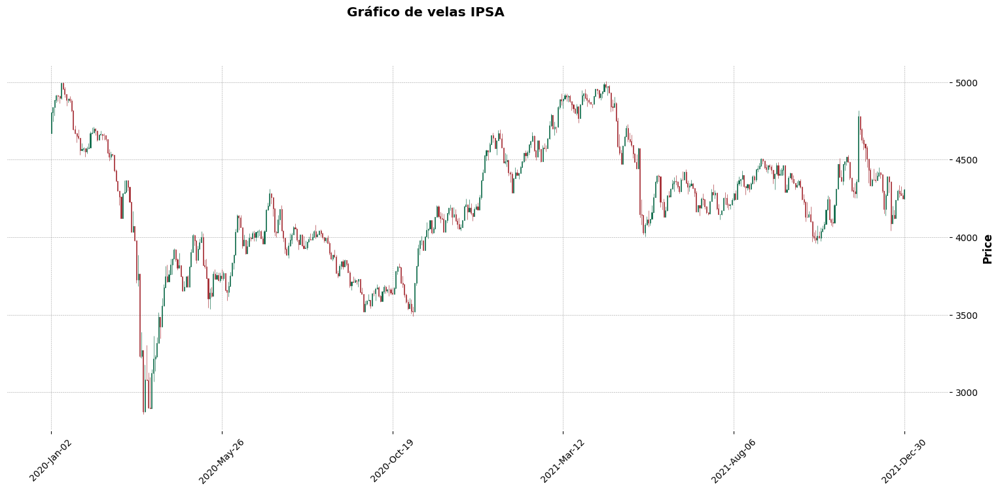

In [620]:
# Filtrar por rango de años
start_year = 2020
end_year = 2021
filtro_df_ipsa_año = df_ipsa.loc[(df_ipsa.index.year >= start_year) & (df_ipsa.index.year <= end_year)]

# Crear el gráfico de velas
mpf.plot(filtro_df_ipsa_año, type='candle', style='charles', title='Gráfico de velas IPSA', figsize = (20,8))

#Transformación para msa 10

In [621]:
df_aguas_a_msa_10 = df_aguas_a['msa_aguas_a'] #1
df_andina_b_msa_10 = df_andina['msa_andina_b'] #2
df_bci_msa_10 = df_bci['msa_bci'] #3
df_bsantander_msa_10 = df_bsantander['msa_bsantander'] #4
df_cap_msa_10 = df_cap['msa_cap'] #5
df_ccu_msa_10 = df_ccu['msa_ccu'] #6
df_cencoshopp_msa_10 = df_cencoshopp['msa_cencoshopp'] #7
df_cencosud_msa_10 = df_cencosud['msa_cencosud'] #8
df_bchile_msa_10 = df_bchile['msa_bchile'] #9
df_cmpc_msa_10 = df_cmpc['msa_cmpc'] #10
df_colbun_msa_10 = df_colbun['msa_colbun'] #11
df_concha_y_toro_msa_10 = df_concha_y_toro['msa_concha_y_toro'] #12
df_copec_msa_10 = df_copec['msa_copec'] #13
df_ecl_msa_10 = df_ecl['msa_ecl'] #14
df_enelam_msa_10 = df_enelam['msa_enelam'] #15
df_enel_chile_msa_10 = df_enel_chile['msa_enel_chile'] #16
df_entel_msa_10 = df_entel['msa_entel'] #17
df_falabella_msa_10 = df_falabella['msa_falabella'] #18
df_iam_msa_10 = df_iam['msa_iam'] #19
df_itau_msa_10 = df_itau['msa_itau'] #20
df_ltm_msa_10 = df_ltm['msa_ltm'] #21
df_mallplaza_msa_10 = df_mallplaza['msa_mallplaza'] #22
df_oro_blanco_msa_10 = df_oro_blanco['msa_oro_blanco'] #23
df_parauco_msa_10 = df_parauco['msa_parauco'] #24
df_quinenco_msa_10 = df_quinenco['msa_quinenco'] #25
df_ripley_msa_10 = df_ripley['msa_ripley'] #26
df_salfacorp_msa_10 = df_salfacorp['msa_salfacorp'] #27
df_smu_msa_10 = df_smu['msa_smu'] #28
df_sqm_b_msa_10 = df_sqm_b['msa_sqm_b'] #29
df_vapores_msa_10 = df_vapores['msa_vapores'] #30



#Unir todos los valores de msa 10 en un solo Data Frame (IPSA)

In [626]:
df_concat = [df_aguas_a_msa_10, df_andina_b_msa_10, df_bci_msa_10, df_bsantander_msa_10, df_cap_msa_10, df_ccu_msa_10, df_cencoshopp_msa_10, df_cencosud_msa_10, df_bchile_msa_10, df_cmpc_msa_10, df_colbun_msa_10, df_concha_y_toro_msa_10, df_copec_msa_10, df_ecl_msa_10, df_enelam_msa_10, df_enel_chile_msa_10, df_entel_msa_10, df_falabella_msa_10, df_iam_msa_10, df_itau_msa_10, df_ltm_msa_10, df_mallplaza_msa_10, df_oro_blanco_msa_10, df_parauco_msa_10, df_quinenco_msa_10, df_ripley_msa_10, df_salfacorp_msa_10, df_smu_msa_10, df_sqm_b_msa_10, df_vapores_msa_10]


df_msa_10 = pd.concat(df_concat, axis=1, join='outer')
df_msa_10 = df_msa_10.fillna(0) #Rellena con 0 los valores faltantes
df_msa_10['promedio_msa_10'] = df_msa_10.sum(axis = 1)/30
df_msa_10.head(10)

,msa_aguas_a,msa_andina_b,msa_bci,msa_bsantander,msa_cap,msa_ccu,msa_cencoshopp,msa_cencosud,msa_bchile,msa_cmpc,...,msa_mallplaza,msa_oro_blanco,msa_parauco,msa_quinenco,msa_ripley,msa_salfacorp,msa_smu,msa_sqm_b,msa_vapores,promedio_msa_10
Date,,,,,,,,,,,,,,,,,,,,,
2014-04-21,0.0,0.0,0.0,0.0,0.0,0.0,0.0,1.0,0.0,0.0,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.033333
2014-04-22,0.0,0.0,0.0,0.0,0.0,0.0,0.0,1.0,0.0,0.0,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.033333
2014-04-23,0.0,0.0,0.0,0.0,0.0,0.0,0.0,1.0,0.0,0.0,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.033333
2014-04-24,0.0,0.0,0.0,0.0,0.0,0.0,0.0,1.0,0.0,0.0,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.033333
2014-04-25,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.000000
2014-04-28,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.000000
2014-04-29,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.000000
2014-04-30,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.000000
2014-05-02,0.0,0.0,0.0,0.0,0.0,0.0,0.0,1.0,0.0,0.0,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.033333


#Gráfico msa10

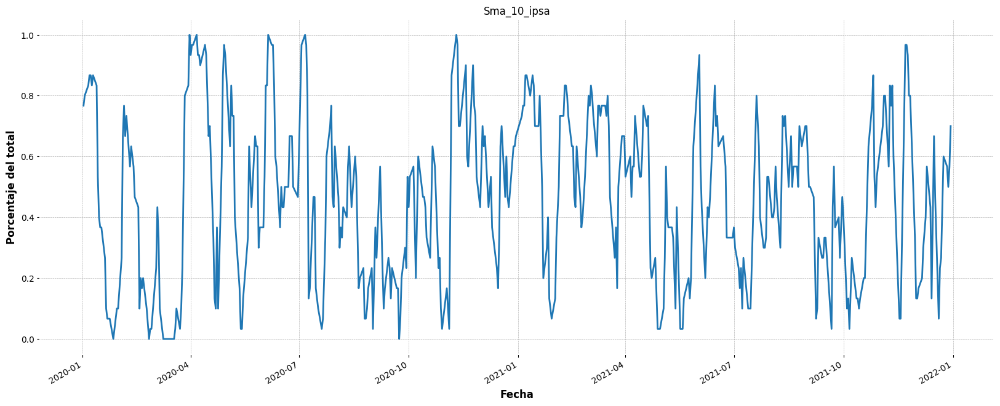

In [634]:
start_year = 2020
end_year = 2021
filtro_df_msa_año = df_msa_10.loc[(df_msa_10.index.year >= start_year) & (df_msa_10.index.year <= end_year)]
filtro_df_msa_año['promedio_msa_10'].plot(figsize = (20,8))
plt.xlabel('Fecha')
plt.title('Sma_10_ipsa')
plt.ylabel('Porcentaje del total')
plt.show()
